# Clustering Assignment 1: Airlines

# Perform clustering (hierarchical,K means clustering and DBSCAN) for the airlines data to obtain optimum number of clusters. 

Draw the inferences from the clusters obtained.

Data Description:
 
The file EastWestAirlinescontains information on passengers who belong to an airline’s frequent flier program. For each passenger the data include information on their mileage history and on different ways they accrued or spent miles in the last year. The goal is to try to identify clusters of passengers that have similar characteristics for the purpose of targeting different segments for different types of mileage offers

ID --Unique ID

Balance--Number of miles eligible for award travel

Qual_mile--Number of miles counted as qualifying for Topflight status

cc1_miles -- Number of miles earned with freq. flyer credit card in the past 12 months:

cc2_miles -- Number of miles earned with Rewards credit card in the past 12 months:

cc3_miles -- Number of miles earned with Small Business credit card in the past 12 months:

1 = under 5,000
2 = 5,000 - 10,000
3 = 10,001 - 25,000
4 = 25,001 - 50,000
5 = over 50,000

Bonus_miles--Number of miles earned from non-flight bonus transactions in the past 12 months

Bonus_trans--Number of non-flight bonus transactions in the past 12 months

Flight_miles_12mo--Number of flight miles in the past 12 months

Flight_trans_12--Number of flight transactions in the past 12 months

Days_since_enrolled--Number of days since enrolled in flier program

Award--whether that person had award flight (free flight) or not

# Introduction

In [1]:
# let's import the important libraries to initiate our task

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns

In [2]:
data = pd.read_csv('EastWestAirlines.csv')

In [3]:
data.head()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1


In [4]:
# now let us edit the names of the columns ID# and Award# and set the ID column as index 

data.rename(columns = {'ID#':'ID', 'Award?':'Award'}, inplace = True)
data.set_index('ID', inplace = True)

data.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
ID,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0
2,19244,0,1,1,1,215,2,0,0,6968,0
3,41354,0,1,1,1,4123,4,0,0,7034,0
4,14776,0,1,1,1,500,1,0,0,6952,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1


# Data Exploration

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3999 entries, 1 to 4021
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Balance            3999 non-null   int64
 1   Qual_miles         3999 non-null   int64
 2   cc1_miles          3999 non-null   int64
 3   cc2_miles          3999 non-null   int64
 4   cc3_miles          3999 non-null   int64
 5   Bonus_miles        3999 non-null   int64
 6   Bonus_trans        3999 non-null   int64
 7   Flight_miles_12mo  3999 non-null   int64
 8   Flight_trans_12    3999 non-null   int64
 9   Days_since_enroll  3999 non-null   int64
 10  Award              3999 non-null   int64
dtypes: int64(11)
memory usage: 374.9 KB


So, we can see that the data set contains 3999 samples and 11 features, and there is no null values.

In [6]:
data.isnull().sum()

Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award                0
dtype: int64

In [7]:
data.describe()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
count,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


In [8]:
# let us check unique values for various coulumns

print('unique_cc1',data.cc1_miles.unique())
print('unique_cc2',data.cc2_miles.unique())
print('unique_cc3',data.cc3_miles.unique())
print('Award',data.Award.unique())

unique_cc1 [1 4 3 2 5]
unique_cc2 [1 2 3]
unique_cc3 [1 3 2 4 5]
Award [0 1]


In [9]:
data.duplicated().sum()

1

In [10]:
data[data.duplicated()]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
ID,,,,,,,,,,,
3899,1000,0,1,1,1,0,0,0,0,1597,0


In [11]:
data_new = data.drop_duplicates(keep = 'first')

In [12]:
data_new.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
ID,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0
2,19244,0,1,1,1,215,2,0,0,6968,0
3,41354,0,1,1,1,4123,4,0,0,7034,0
4,14776,0,1,1,1,500,1,0,0,6952,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1


In [13]:
data_new.duplicated().sum()

0

In [14]:
data_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3998 entries, 1 to 4021
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Balance            3998 non-null   int64
 1   Qual_miles         3998 non-null   int64
 2   cc1_miles          3998 non-null   int64
 3   cc2_miles          3998 non-null   int64
 4   cc3_miles          3998 non-null   int64
 5   Bonus_miles        3998 non-null   int64
 6   Bonus_trans        3998 non-null   int64
 7   Flight_miles_12mo  3998 non-null   int64
 8   Flight_trans_12    3998 non-null   int64
 9   Days_since_enroll  3998 non-null   int64
 10  Award              3998 non-null   int64
dtypes: int64(11)
memory usage: 374.8 KB


Okay now we have 3998, and there is no null or duplicated values

# Exploratory Data Analysis

## Histogram and Kernal Density

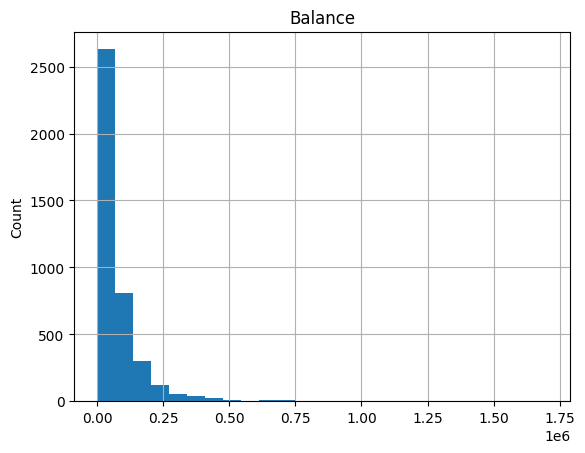

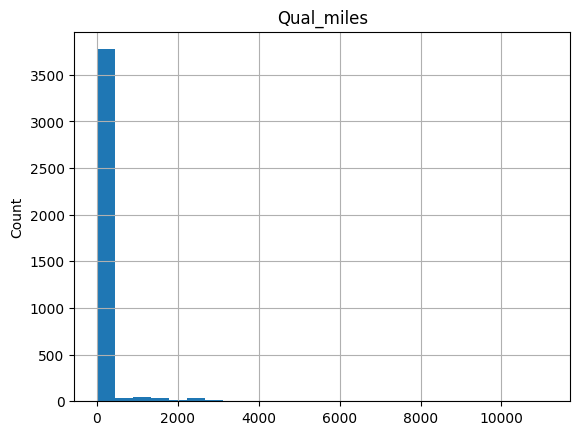

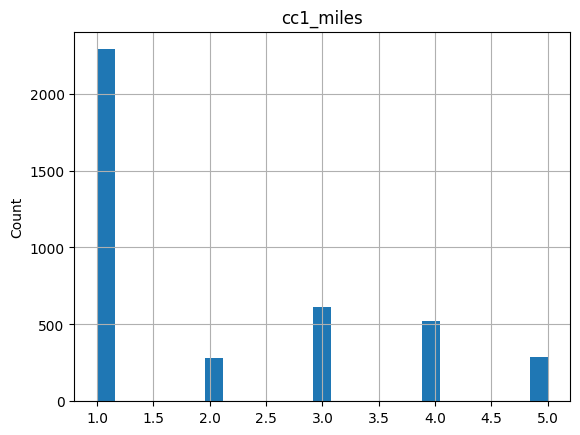

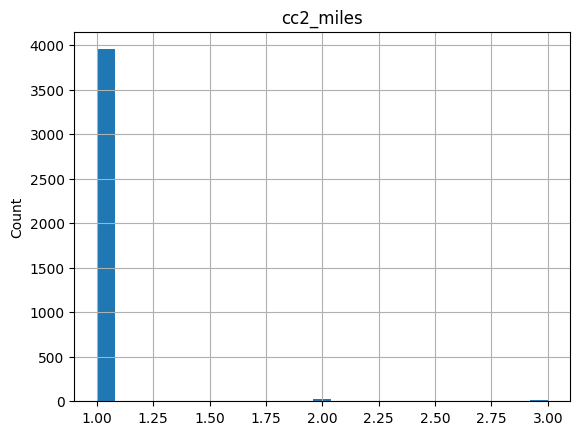

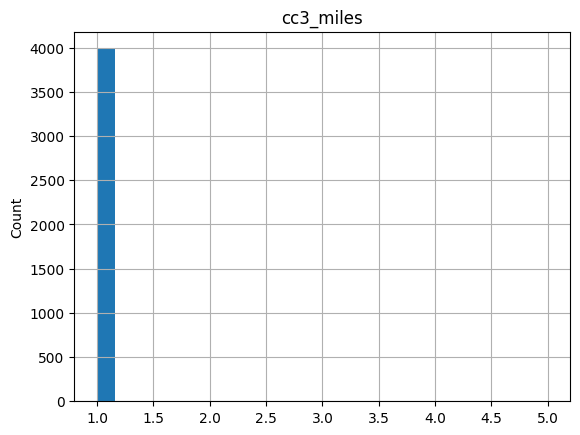

...

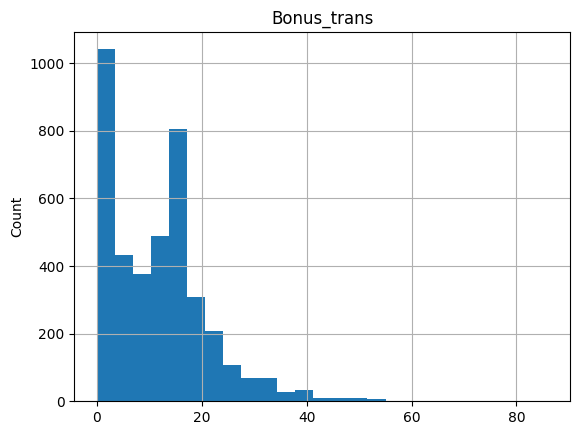

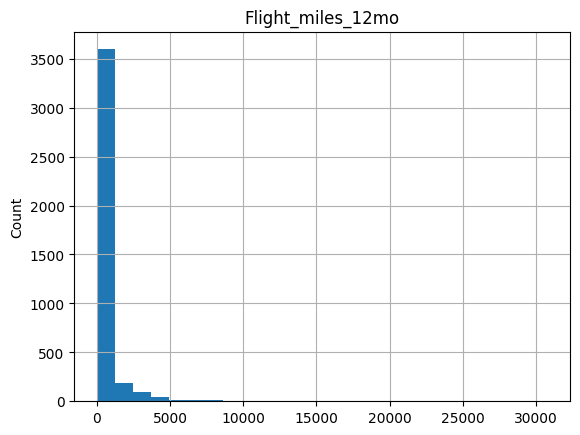

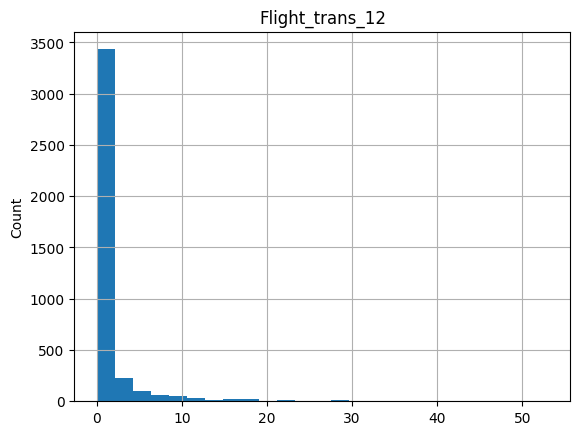

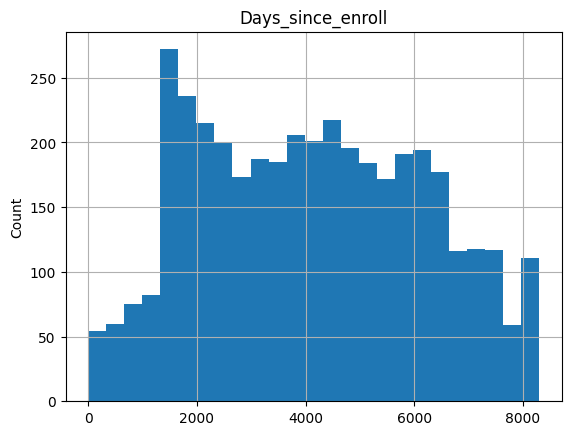

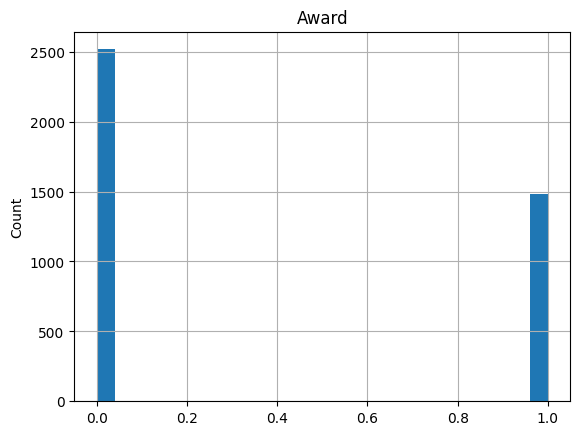

In [15]:
for feature in data_new.columns:
    df = data_new.copy()
    df[feature].hist(bins = 25)
    plt.ylabel('Count')
    plt.title(feature)
    plt.show()

Balance


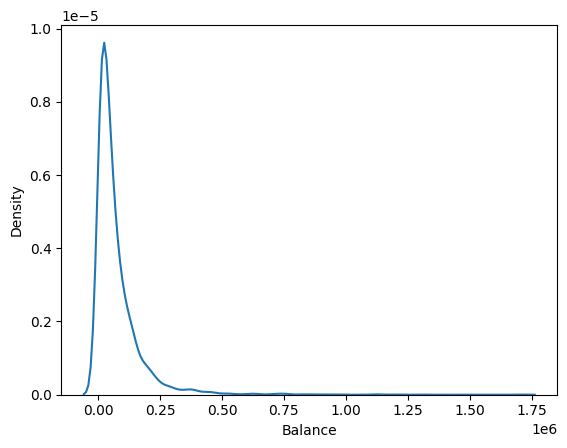

Qual_miles


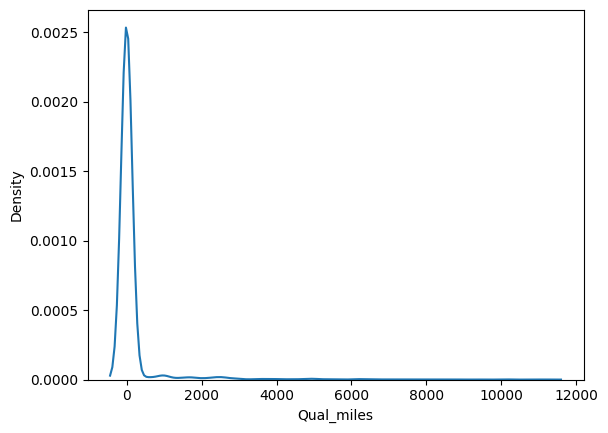

cc1_miles


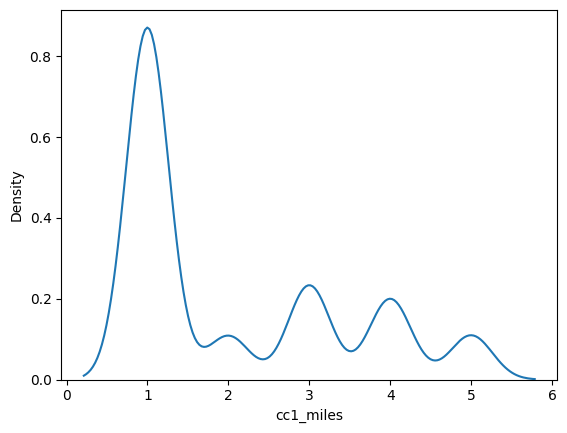

cc2_miles


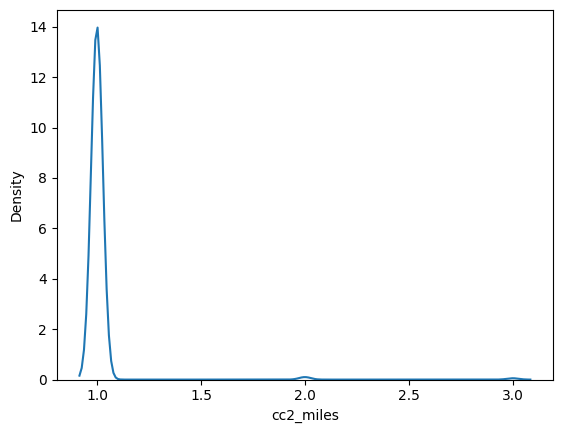

cc3_miles


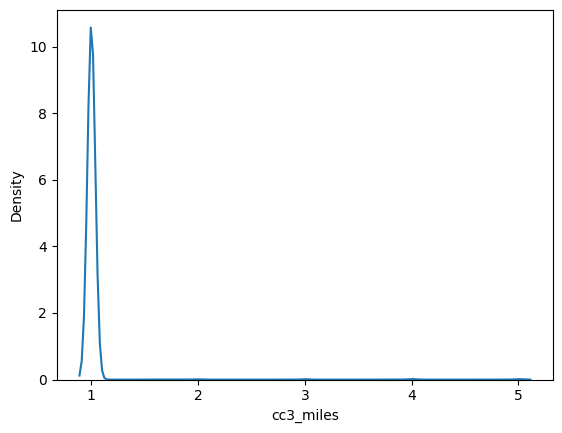

Bonus_miles


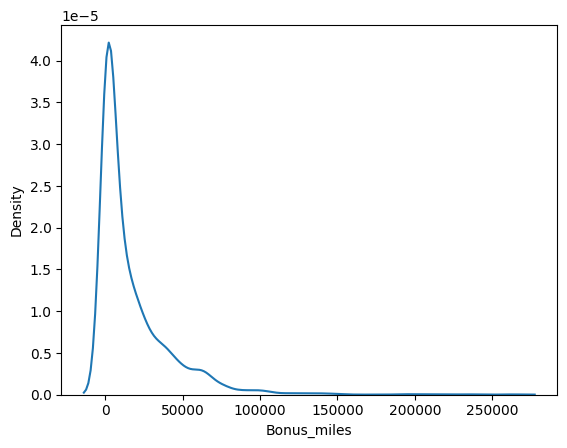

Bonus_trans


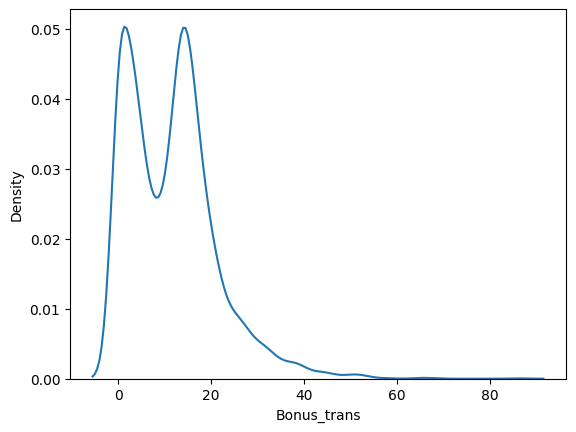

Flight_miles_12mo


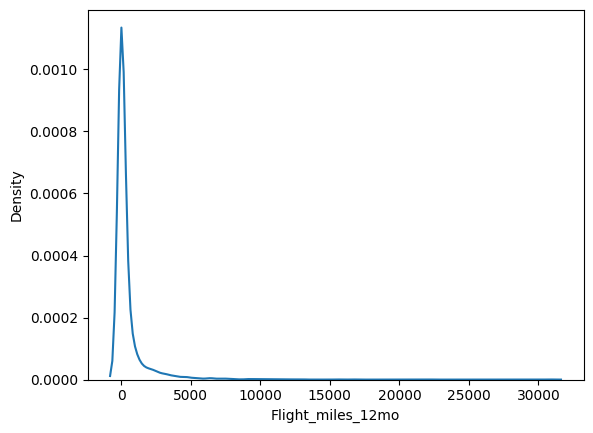

Flight_trans_12


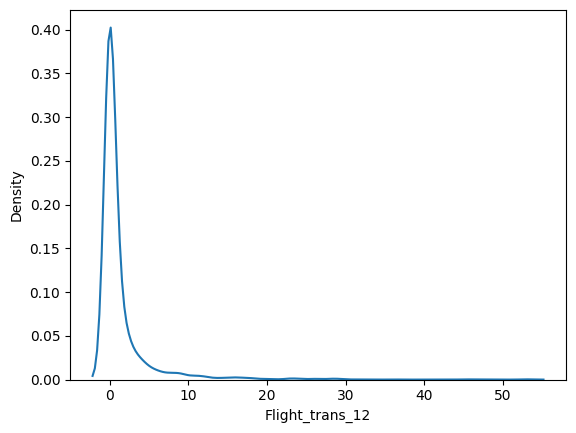

Days_since_enroll


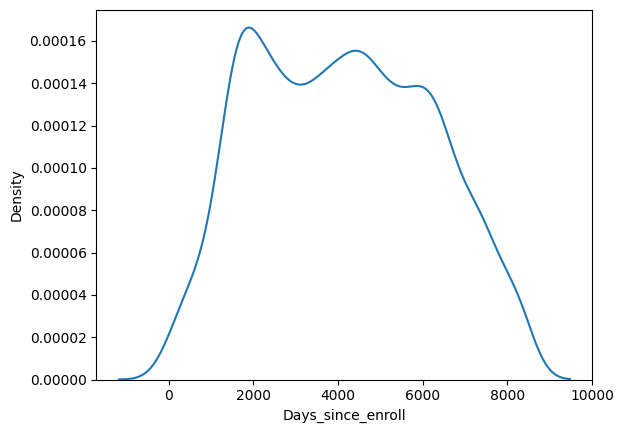

Award


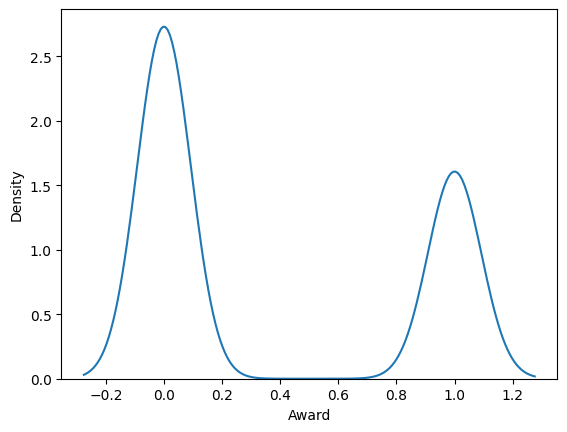

In [16]:
# kernel density for every feature, singled out

for n in data_new.columns:
    print(n)
    sns.kdeplot(data_new[n])
    plt.show()

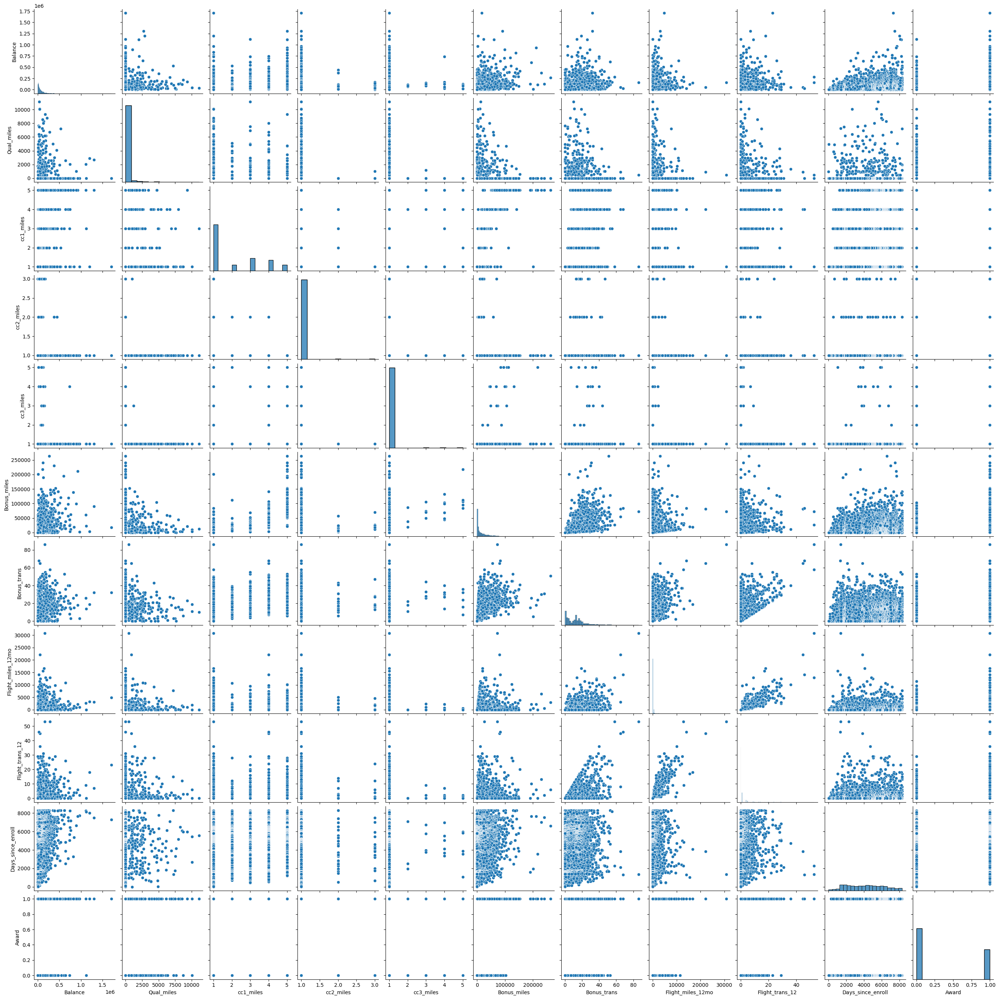

In [17]:
sns.pairplot(data_new)

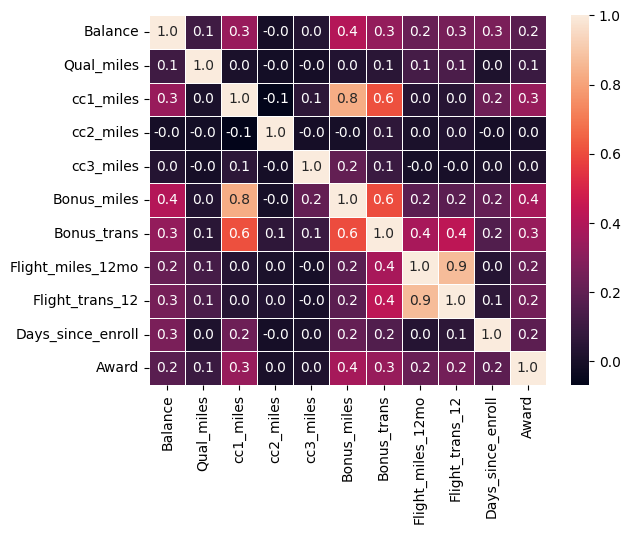

In [18]:
plt.subplots(figure = (18,12))
sns.heatmap(data_new.corr(), annot = True, linewidth = .5, fmt = '.1f')
plt.show()

In [19]:
countNotermdeposit = len(data[data.Award == 0])
counthavetermdeposit = len(data[data.Award == 1])

print("Percentage of Customer doesn't have a Award: {:.2f}%".format((countNotermdeposit) / (len(data_new.Award))*100))
print("Percentage of Customer does have a Award: {:.2f}%".format((counthavetermdeposit) / (len(data_new.Award))*100))

Percentage of Customer doesn't have a Award: 62.98%
Percentage of Customer does have a Award: 37.04%


Text(0.5, 1.0, 'whether the client has a Award or not')

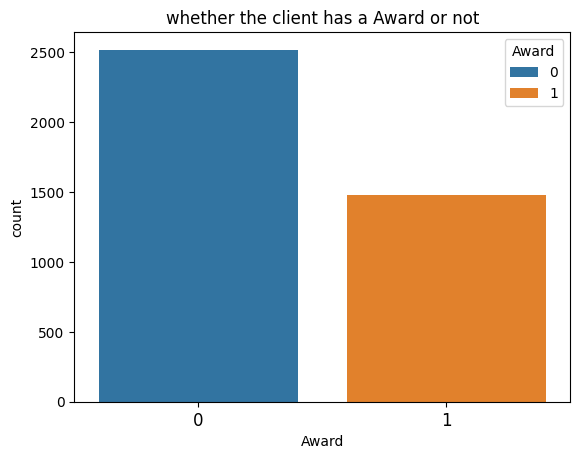

In [20]:
sns.countplot(x = 'Award', data = data_new, 
              order = data_new['Award'].value_counts().index, hue = 'Award')
plt.xticks(fontsize = 12)
plt.title('whether the client has a Award or not')

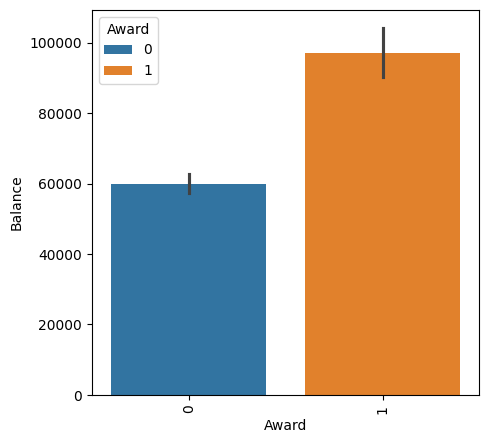

In [21]:
# Balance =: Number of miles eligible for award travel

plt.figure(figsize = (5,5))
Balance = data_new[['Award','Balance']].sort_values('Balance', ascending = True)
ax = sns.barplot(x = 'Award', y = 'Balance', data = Balance, hue = 'Award')
ax.set(xlabel = 'Award', ylabel = 'Balance')
plt.xticks(rotation = 90)
plt.show()

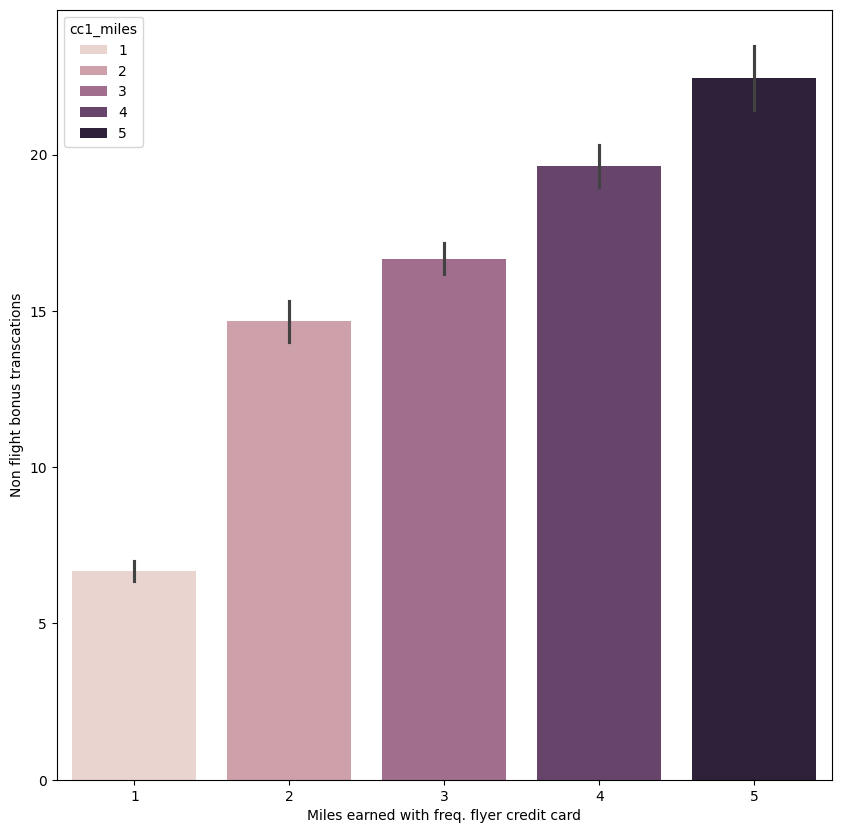

In [22]:
plt.figure(figsize = (10,10))
sorted_data = data_new[['cc1_miles','Bonus_trans']].sort_values('Bonus_trans', ascending = False)
ax = sns.barplot(x = 'cc1_miles', y = 'Bonus_trans', data = sorted_data, hue = 'cc1_miles')
ax.set(xlabel = 'Miles earned with freq. flyer credit card', ylabel = 'Non flight bonus transcations')
plt.show()

# Data Preprocessing

## Standardization of Data

In [23]:
from sklearn.preprocessing import StandardScaler

In [24]:
standard_scaler = StandardScaler()
std_df = standard_scaler.fit_transform(data_new)
std_df.shape

(3998, 11)

## Normalization of the data

In [27]:
from sklearn.preprocessing import MinMaxScaler

In [28]:
minmax = MinMaxScaler()
minmax_df = minmax.fit_transform(data_new)
minmax_df.shape

(3998, 11)

We are going to use two type of standardised data for our analysis. 

## Outlier detection

In [223]:
data_new.columns

Index(['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'Award'],
      dtype='object')

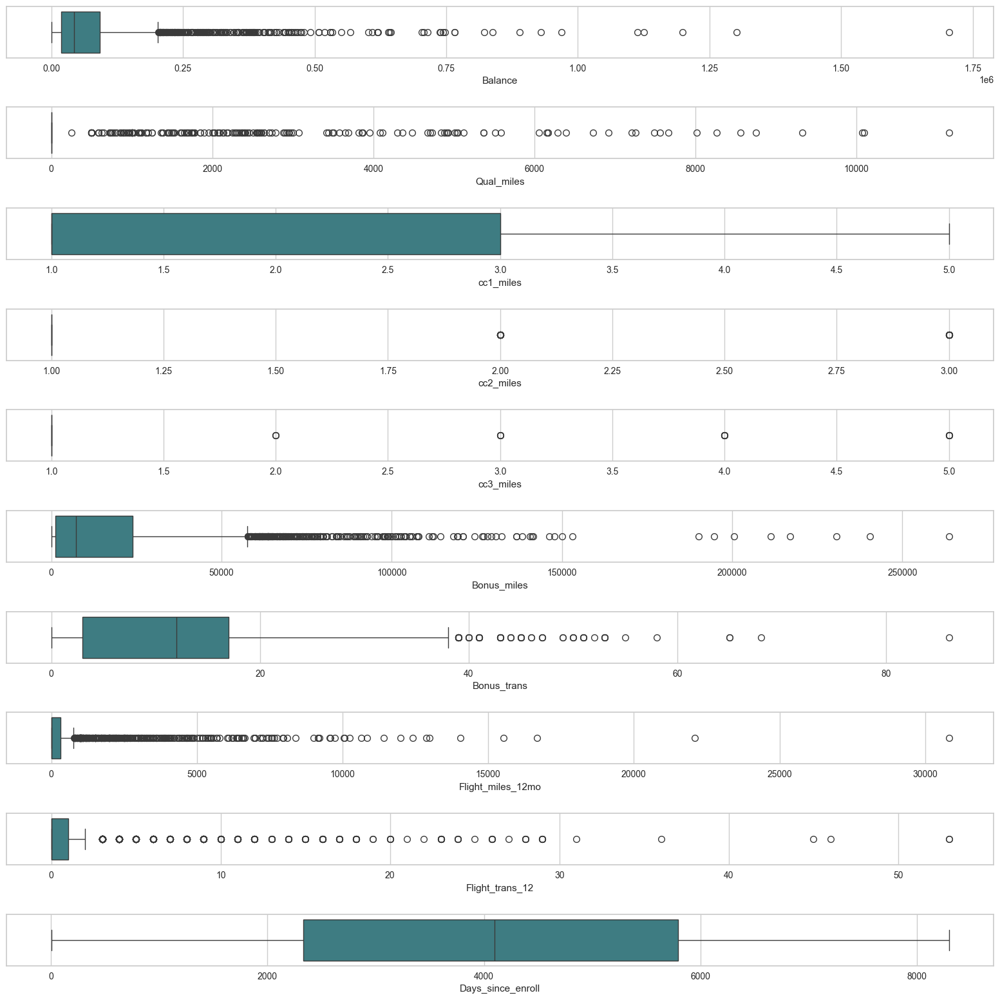

In [224]:
ot=data_new.copy() 
fig, axes=plt.subplots(10,1,figsize=(16,16),sharex=False,sharey=False)
sns.boxplot(x='Balance',data=ot,palette='crest',ax=axes[0])
sns.boxplot(x='Qual_miles',data=ot,palette='crest',ax=axes[1])
sns.boxplot(x='cc1_miles',data=ot,palette='crest',ax=axes[2])
sns.boxplot(x='cc2_miles',data=ot,palette='crest',ax=axes[3])
sns.boxplot(x='cc3_miles',data=ot,palette='crest',ax=axes[4])
sns.boxplot(x='Bonus_miles',data=ot,palette='crest',ax=axes[5])
sns.boxplot(x='Bonus_trans',data=ot,palette='crest',ax=axes[6])
sns.boxplot(x='Flight_miles_12mo',data=ot,palette='crest',ax=axes[7])
sns.boxplot(x='Flight_trans_12',data=ot,palette='crest',ax=axes[8])
sns.boxplot(x='Days_since_enroll',data=ot,palette='crest',ax=axes[9])
plt.tight_layout(pad=2.0)

<Axes: >

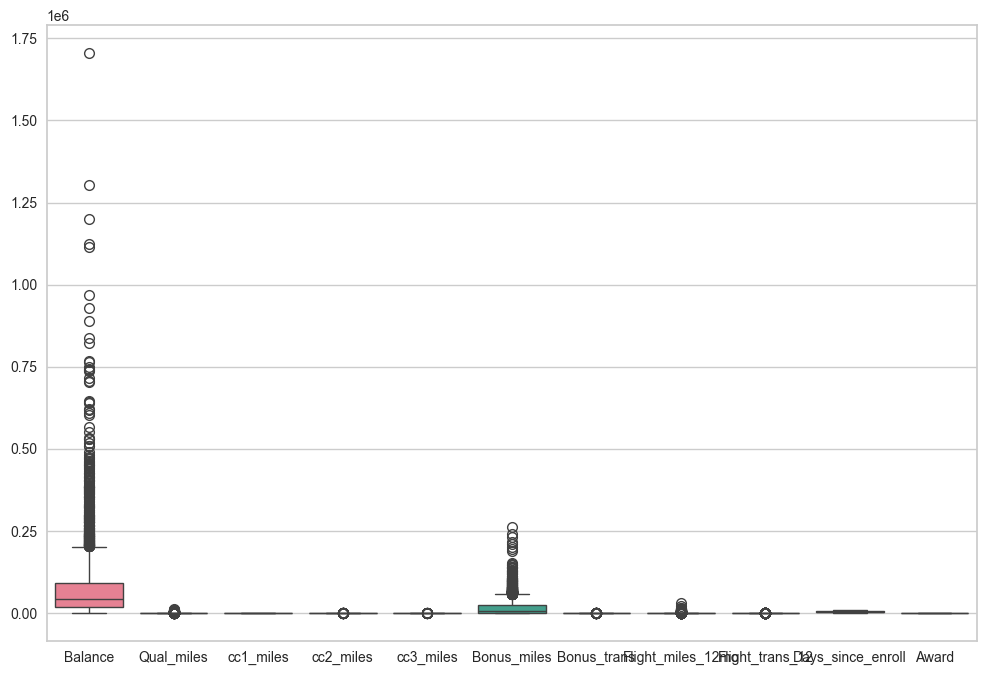

In [225]:
plt.figure(figsize = (12,8))
sns.boxplot(data = data_new)

<Axes: >

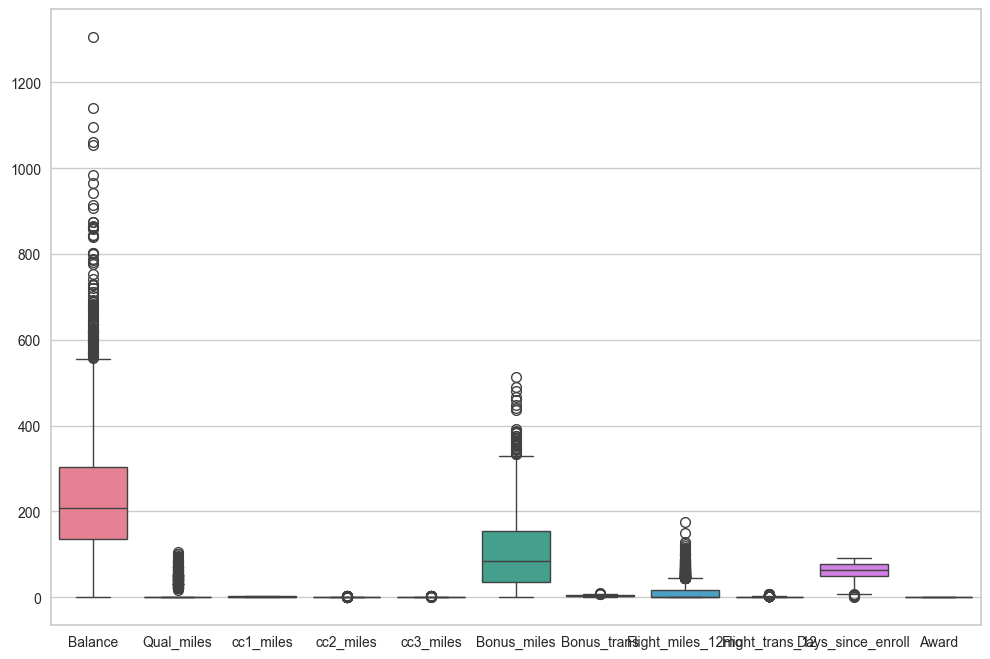

In [226]:
plt.figure(figsize = (12,8))
sns.boxplot(data = np.sqrt(data_new))

Am not tempering with outliers here. Though I know that K-means is sensitive towards outliers but DBSCAN is robust. So,let's find out. 

# KMeans Clustering

## Elbow Method for Determining Cluster Amount

### On data scaled using StandardScaler

In [29]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
import scipy.cluster.hierarchy as sch
from sklearn.metrics import silhouette_score as sil, calinski_harabasz_score as chs, silhouette_samples

In [30]:
cluster_range = range(1,15)
cluster_error = []
for num_clusters in cluster_range:
    clusters = KMeans(num_clusters, n_init = 10)
    clusters.fit(std_df)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    cluster_error.append(clusters.inertia_)
cluster_df = pd.DataFrame({'num_clusters':cluster_range, 'cluster_errors': cluster_error})
cluster_df

,num_clusters,cluster_errors
0,1,43978.000000
1,2,35402.335643
2,3,30893.111682
3,4,27157.030546
4,5,23702.302320
5,6,21466.974220
6,7,19879.763646
7,8,17314.499688
8,9,16047.219192
9,10,14725.185611


In [31]:
import warnings
warnings.filterwarnings('ignore')

43978.00000000004
35402.34114281715
30899.260905703868
27148.562802612054
23702.268099909415
21468.661685069754
18890.63832460416
17314.499687910313


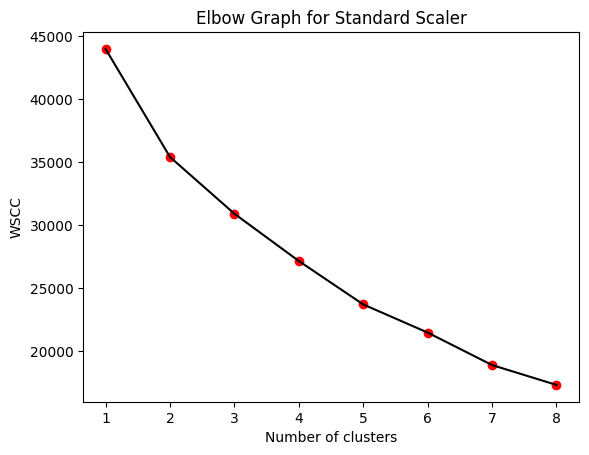

In [32]:
# within cluster sum of squares criterion

wscc = []
for i in range(1,9):
    kmeans = KMeans(n_clusters = i, random_state = 2)
    kmeans.fit(std_df)
    wscc.append(kmeans.inertia_)
    print(kmeans.inertia_)

plt.plot(range(1,9),wscc, color = 'k')
plt.scatter(range(1,9),wscc, color = 'red')
plt.title('Elbow Graph for Standard Scaler')
plt.xlabel('Number of clusters')
plt.ylabel('WSCC')
plt.show()

There is no clear elbow here, but we can see that the graph bends slightly around 2 and then again at 5.  

But let us also look at the silhouette score.

## Silhouette Score method

In [33]:
n_clusters = [2,3,4,5,6,7,8,9,10]
clusters_inertia = []
s_scores = []

for n in n_clusters:
    KM_est = KMeans(n_clusters = n, init = 'k-means++').fit(std_df)
    clusters_inertia.append(KM_est.inertia_)
    silhouette_avg = sil(std_df, KM_est.labels_)
    s_scores.append(silhouette_avg)

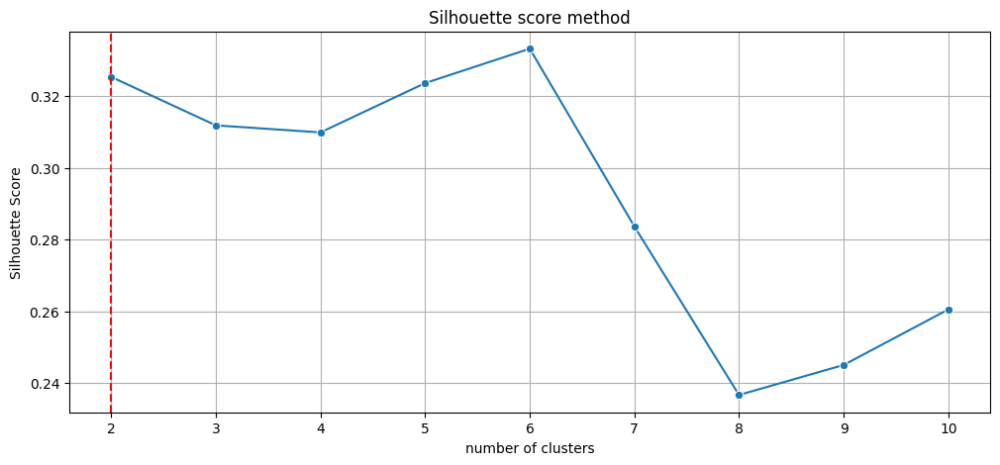

In [34]:
fig, ax = plt.subplots(figsize = (12,5))
ax = sns.lineplot(x = n_clusters, y= s_scores, marker ='o', ax = ax)
ax.set_title('Silhouette score method')
ax.set_xlabel('number of clusters')
ax.set_ylabel('Silhouette Score')
ax.axvline(2, ls = '--',c = 'red')
plt.grid()
plt.show()

The best score as per the silhouette score method is 6. Let us explore more.

In [35]:
from yellowbrick.cluster import KElbowVisualizer

Elbow plot for standard scaler data


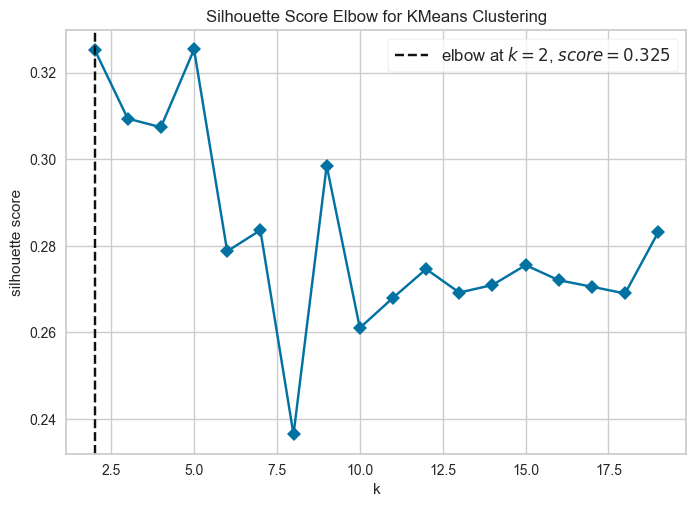

In [36]:
#Now we will check for two different hyperparamters value effect 

model = KMeans(random_state = 10, max_iter = 500, init = 'k-means++')

visualizer = KElbowVisualizer(model, k = (2,20), metric = 'silhouette', timings = False)
print('Elbow plot for standard scaler data')
visualizer.fit(std_df)
visualizer.poof()
plt.show()

In [37]:
import matplotlib.cm as cm

For n_clusters = 2 The average silhouette_score is:  0.32531882107641713
For n_clusters = 3 The average silhouette_score is:  0.3093707533849438
For n_clusters = 4 The average silhouette_score is:  0.30737495457637515
For n_clusters = 5 The average silhouette_score is:  0.3253273851737551
For n_clusters = 6 The average silhouette_score is:  0.2787413974567386
For n_clusters = 7 The average silhouette_score is:  0.2836083093488307
For n_clusters = 8 The average silhouette_score is:  0.23645053421774492
For n_clusters = 9 The average silhouette_score is:  0.298511461115008
For n_clusters = 10 The average silhouette_score is:  0.26104882606785285


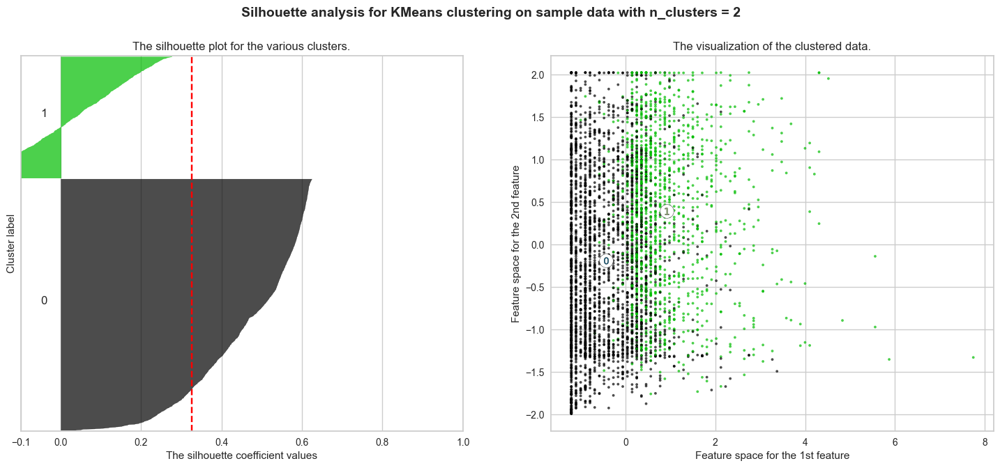

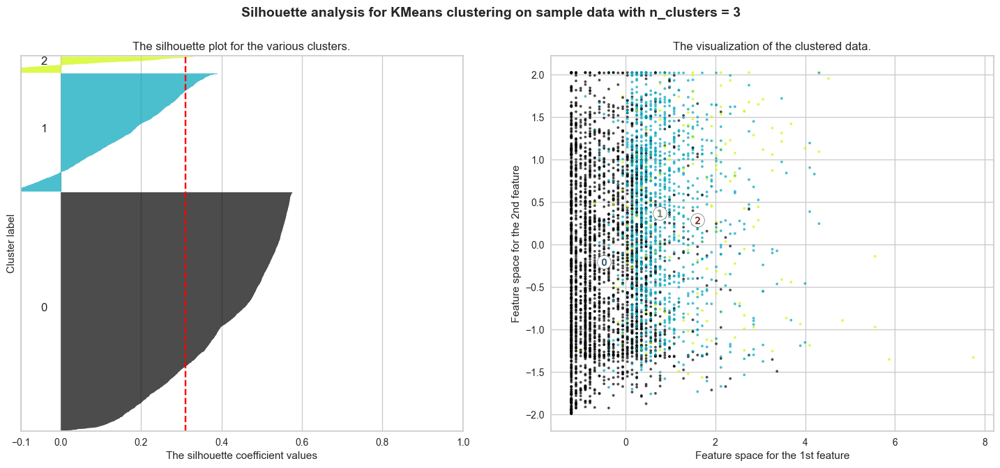

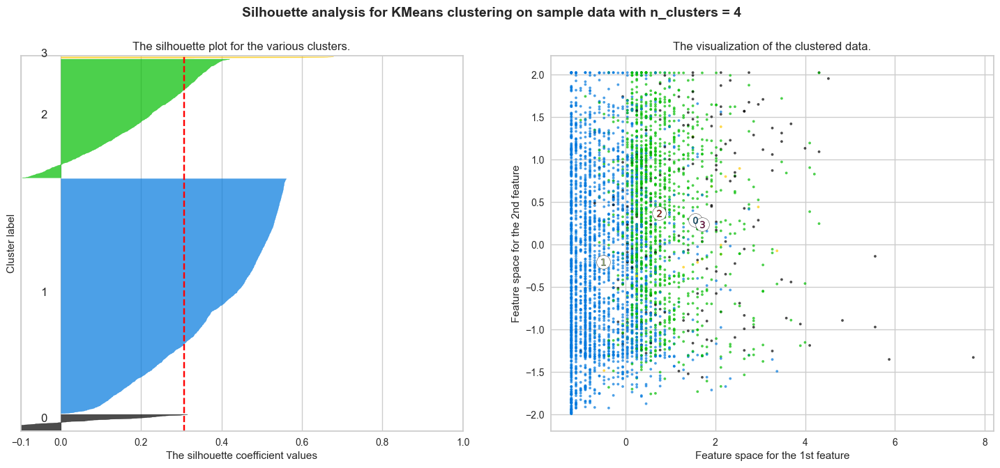

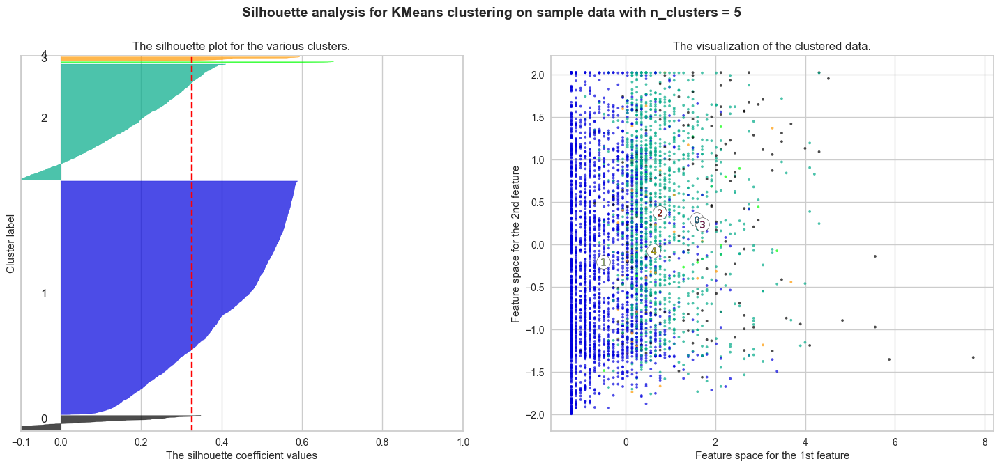

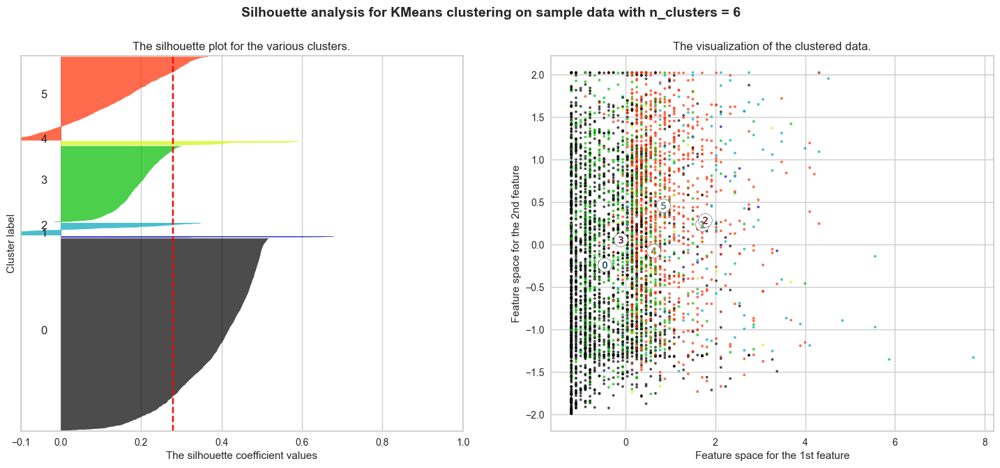

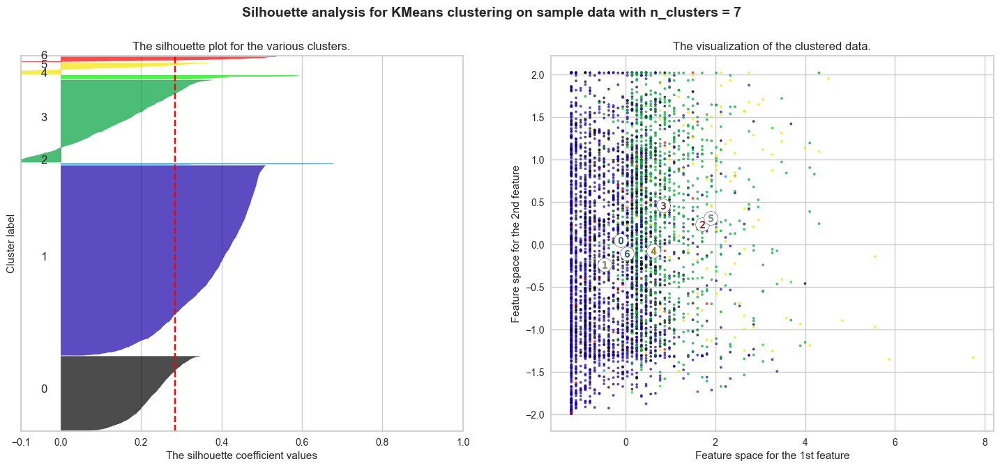

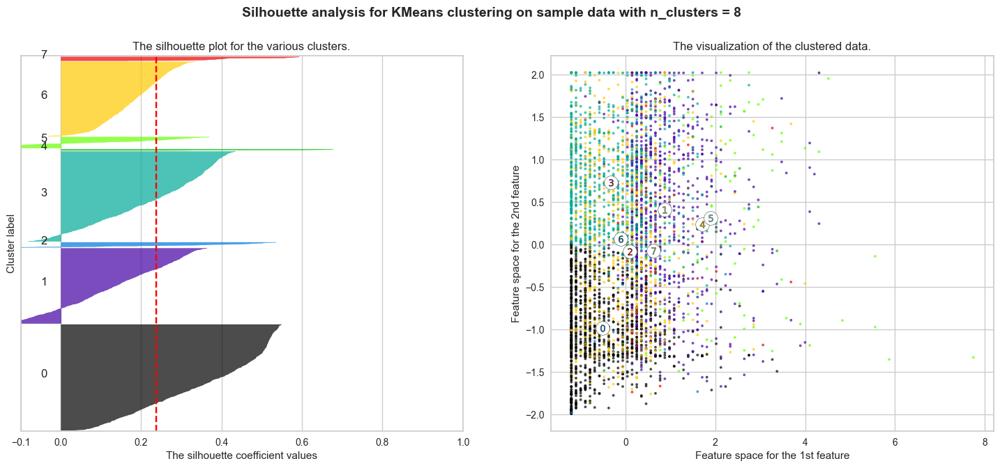

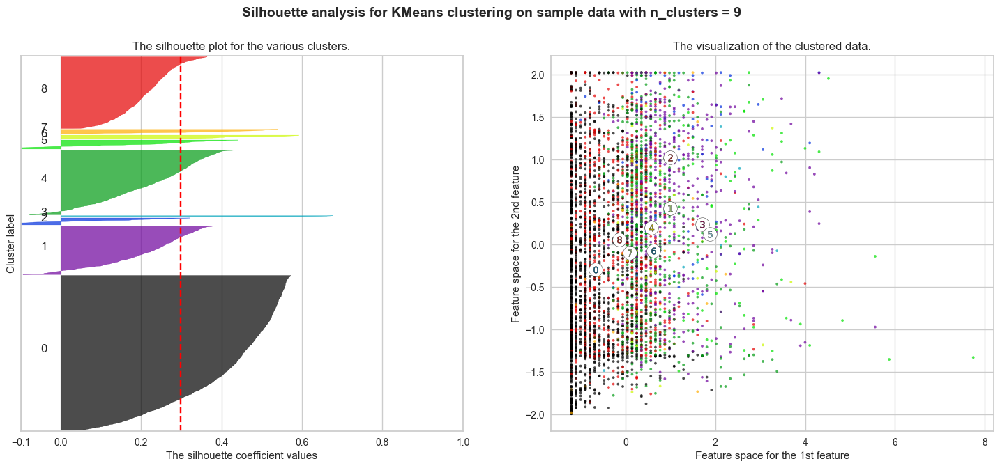

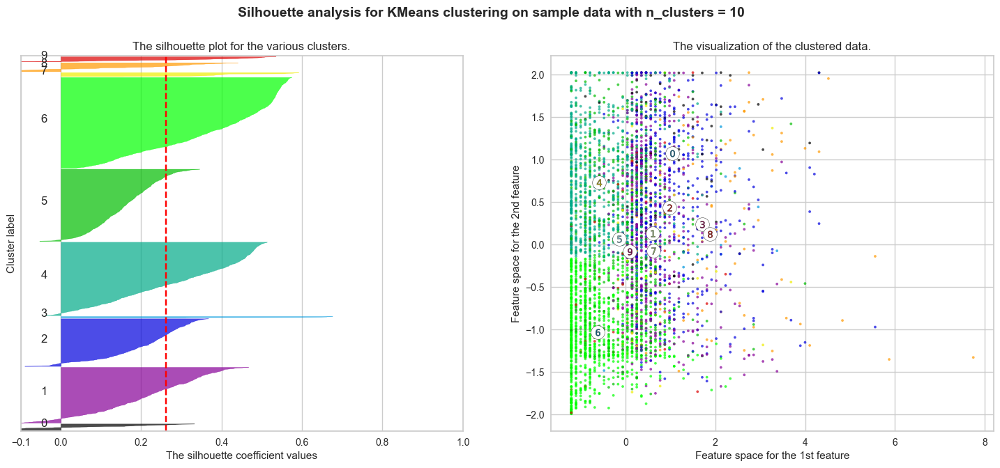

In [39]:
range_n_clusters = [2,3,4,5,6,7,8,9,10]

for n_clusters in range_n_clusters:
    # create a subplot with 1 row and 2 columns 
    fig, (ax1, ax2) = plt.subplots(1,2)
    fig.set_size_inches(18,7)

    # 1st plot:- silhouette plot
    ax1.set_xlim([-0.1,1])
    ax1.set_ylim([0, len(std_df) + (n_clusters +1)*10])


    clusterer = KMeans(n_clusters = n_clusters, random_state = 10)
    cluster_labels = clusterer.fit_predict(std_df)

    silhouette_avg = sil(std_df, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters, 
        "The average silhouette_score is: ",
        silhouette_avg,
    )

    sample_silhouette_values = silhouette_samples(std_df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):

        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels ==i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]

        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i)/n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor = color,
            edgecolor = color, 
            alpha = 0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10
        
    ax1.set_title('The silhouette plot for the various clusters.')
    ax1.set_xlabel('The silhouette coefficient values')
    ax1.set_ylabel('Cluster label')


    ax1.axvline(x = silhouette_avg, color = 'red', linestyle = '--')

    ax1.set_yticks([])
    ax1.set_xticks([-0.1,0,0.2,0.4,0.6,0.8,1])

    # 2nd plot 

    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        std_df[:,6], std_df[:,9],marker = '.', s = 30, lw = 0, alpha = 0.7, c = colors, edgecolor = 'k')

    centers = clusterer.cluster_centers_

    ax2.scatter(
        centers[:,6], centers[:,9],
        marker = 'o',
        c = 'white',
        alpha = 1,
        s = 200,
        edgecolor = 'k',
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[6],c[9], marker = '$%d$' % i, alpha =1, s = 50, edgecolor = 'k')

    ax2.set_title('The visualization of the clustered data.')
    ax2.set_xlabel('Feature space for the 1st feature')
    ax2.set_ylabel('Feature space for the 2nd feature')


    plt.suptitle(
        'Silhouette analysis for KMeans clustering on sample data with n_clusters = %d'
        % n_clusters,
        fontsize = 14,
        fontweight = 'bold'
    )
        
plt.show()


__Conclusion:__

both from the Eblow test and silhouette test, we can establish that, 5 clusters might be the optimal number of clusters. 

## KMeans cluster for 5 clusters

In [51]:
model = KMeans(n_clusters = 5, random_state = 1001, init = 'k-means++')
y_pred = model.fit_predict(std_df)
y_pred.shape

(3998,)

In [52]:
y_pred

array([1, 1, 1, ..., 0, 1, 1])

In [53]:
model.cluster_centers_

array([[ 0.4282955 ,  0.02364665,  1.18672735, -0.09825429, -0.05479023,
         0.90688561,  0.74005306, -0.08128735, -0.09241869,  0.37392852,
         0.57252821],
       [-0.29639861, -0.06253607, -0.60913552, -0.09825429, -0.06072653,
        -0.52077811, -0.50105096, -0.18494153, -0.19777608, -0.21000705,
        -0.35309105],
       [ 1.18090497,  0.85929758,  0.09160078, -0.09825429, -0.06277446,
         0.61295537,  1.61133399,  3.60622854,  3.86440509,  0.2885442 ,
         0.90544174],
       [-0.04706705, -0.15626333, -0.66838569,  9.03710982, -0.06277446,
        -0.1018366 ,  0.61758448,  0.08745745,  0.22023229, -0.0727739 ,
         0.0515894 ],
       [ 0.63950059, -0.08446932,  1.02183982, -0.09825429, 15.64433492,
         3.1793166 ,  1.7144102 ,  0.0332068 ,  0.05959833,  0.2395819 ,
         0.33731815]])

In [54]:
model.inertia_   # within cluster sum of square

23696.39757295075

In [55]:
df_label_kmeans1 = data_new.copy()

In [56]:
df_label_kmeans1['KMeans_label'] = model.labels_

In [57]:
df_label_kmeans1.groupby('KMeans_label').agg(['mean'])

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
KMeans_label,,,,,,,,,,,
0,116918.090055,163.208301,3.697729,1.000000,1.001566,39152.506656,18.732185,347.941269,1.027408,4892.637431,0.649178
1,43855.304348,95.539689,1.224970,1.000000,1.000399,4602.891105,6.811328,200.755884,0.622657,3687.761468,0.199840
2,192618.243590,808.955128,2.185897,1.000000,1.000000,31951.666667,27.076923,5509.576923,16.032051,4714.961538,0.807692
3,68876.581395,23.255814,1.139535,2.348837,1.000000,14689.837209,17.534884,582.627907,2.209302,3968.930233,0.395349
4,138061.400000,78.800000,3.466667,1.000000,4.066667,93927.866667,28.066667,506.666667,1.600000,4613.866667,0.533333


In [69]:
df_label_kmeans1

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,KMeans_label
ID,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,1
2,19244,0,1,1,1,215,2,0,0,6968,0,1
3,41354,0,1,1,1,4123,4,0,0,7034,0,1
4,14776,0,1,1,1,500,1,0,0,6952,0,1
5,97752,0,4,1,1,43300,26,2077,4,6935,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1,1
4018,64385,0,1,1,1,981,5,0,0,1395,1,1
4019,73597,0,3,1,1,25447,8,0,0,1402,1,0


In [58]:
from yellowbrick.cluster import SilhouetteVisualizer as sv

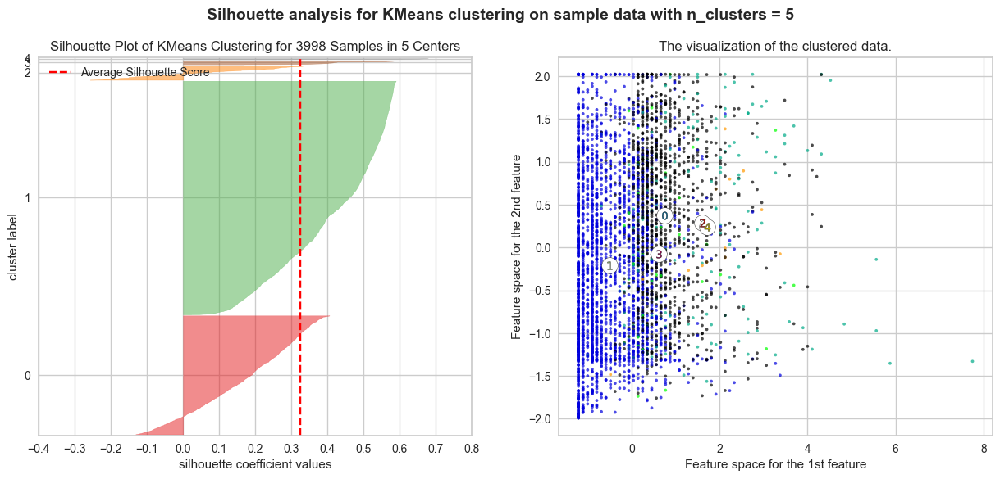

In [66]:
fig, (ax1, ax2) = plt.subplots(1,2,sharey = False)
fig.set_size_inches(15,6)

sil_vis1 = sv(model, ax = ax1)
sil_vis1.fit(std_df)

color = cm.nipy_spectral(model.labels_.astype(float)/ 5)
ax2.scatter(std_df[:,6], std_df[:,9], marker = '.', s = 30, lw = 0, alpha = 0.7,
            c = color, edgecolor = 'k')

centers1 = model.cluster_centers_

ax2.scatter(centers1[:,6], centers1[:,9], marker = 'o', c = 'white', alpha = 1, s = 200, edgecolor = 'k')

for i, c in enumerate(centers1):
    ax2.scatter(c[6], c[9], marker = '$%d$' % i, alpha = 1, s = 50, edgecolor = 'k')

ax2.set_title(label ="The visualization of the clustered data.")
ax2.set_xlabel("Feature space for the 1st feature")
ax2.set_ylabel("Feature space for the 2nd feature")

plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % 5),fontsize=14, fontweight='bold')

sil_vis1.show()
plt.show()

In [77]:
df_label_kmeans1.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,KMeans_label
ID,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,1
2,19244,0,1,1,1,215,2,0,0,6968,0,1
3,41354,0,1,1,1,4123,4,0,0,7034,0,1
4,14776,0,1,1,1,500,1,0,0,6952,0,1
5,97752,0,4,1,1,43300,26,2077,4,6935,1,0


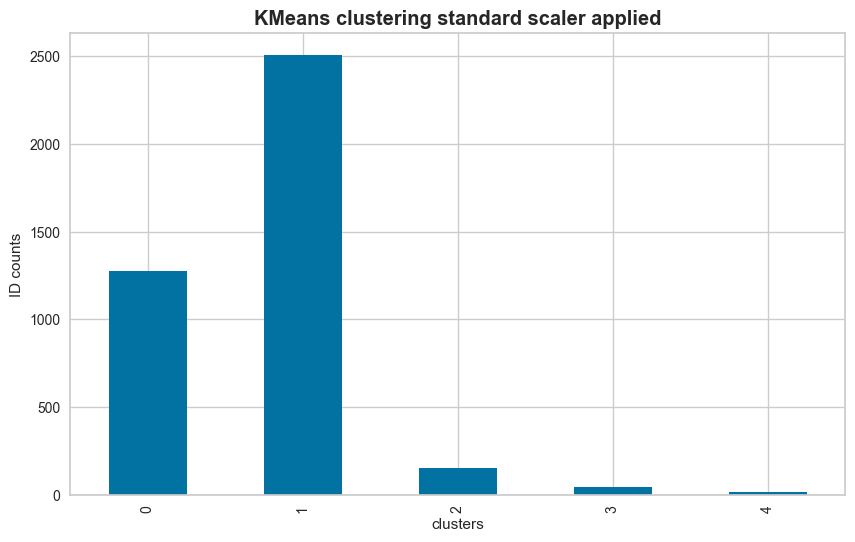

In [85]:
fig, ax = plt.subplots(figsize = (10,6))
df.groupby(df_label_kmeans1['KMeans_label']).count()['Balance'].plot(kind = 'bar')
# the column 'Balance' is used for counting purpose and nothing more than that
plt.ylabel('ID counts')
plt.title('KMeans clustering standard scaler applied', fontsize = 'large', fontweight = 'bold')
plt.xlabel('clusters')
plt.show()

## Elbow method and silhouette score on MinMaxScaler applied data

In [86]:
cluster_range = range(1,15)
cluster_error = []
for num_clusters in cluster_range:
    clusters = KMeans(num_clusters, n_init = 10)
    clusters.fit(minmax_df)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    cluster_error.append(clusters.inertia_)
cluster_df = pd.DataFrame({'num_clusters':cluster_range, 'cluster_errors': cluster_error})
cluster_df

,num_clusters,cluster_errors
0,1,1830.468023
1,2,823.558363
2,3,625.110961
3,4,436.642089
4,5,348.934750
5,6,315.307024
6,7,287.718915
7,8,263.037239
8,9,243.921941
9,10,226.117313


1830.4680233661593
823.5583625482057
625.1017196313419
436.642089093596
348.9348563312635
315.2983398444555
287.93354201753795
263.0403475584564


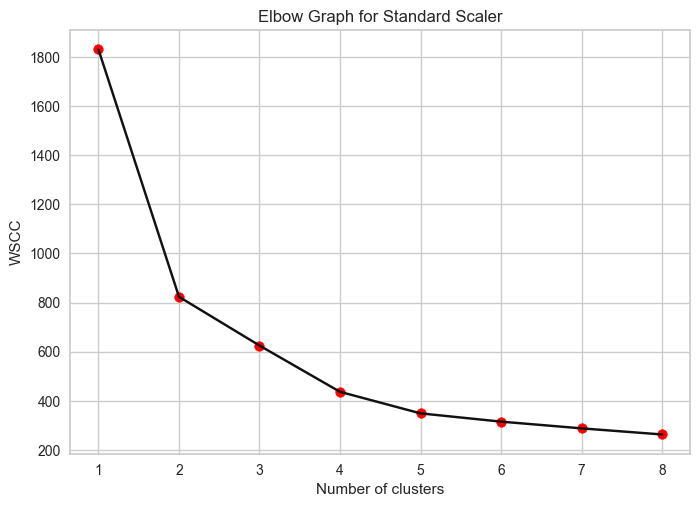

In [87]:
# within cluster sum of squares criterion

wscc = []
for i in range(1,9):
    kmeans = KMeans(n_clusters = i, random_state = 2)
    kmeans.fit(minmax_df)
    wscc.append(kmeans.inertia_)
    print(kmeans.inertia_)

plt.plot(range(1,9),wscc, color = 'k')
plt.scatter(range(1,9),wscc, color = 'red')
plt.title('Elbow Graph for Standard Scaler')
plt.xlabel('Number of clusters')
plt.ylabel('WSCC')
plt.show()

In [91]:
n_clusters = [2,3,4,5,6,7,8,9,10]
clusters_inertia = []
s_scores = []

for n in n_clusters:
    KM_est = KMeans(n_clusters = n, init = 'k-means++').fit(minmax_df)
    clusters_inertia.append(KM_est.inertia_)
    silhouette_avg = sil(std_df, KM_est.labels_)
    s_scores.append(silhouette_avg)

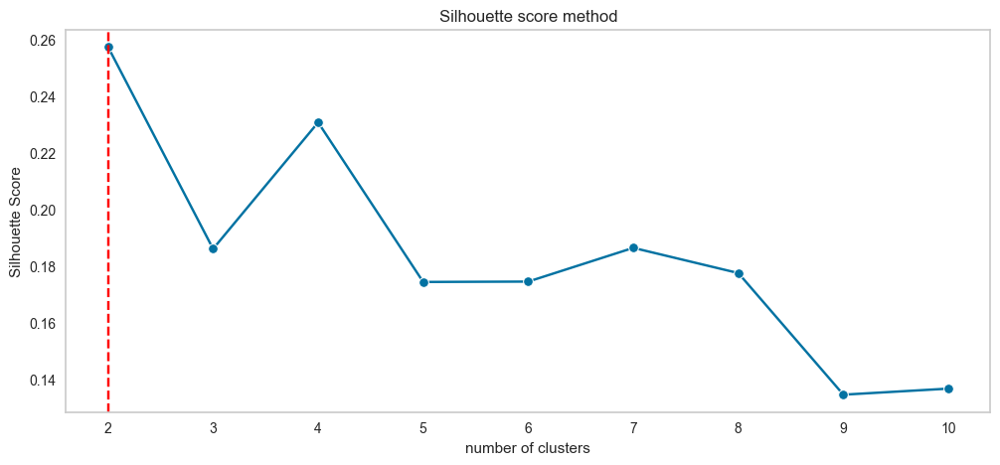

In [92]:
fig, ax = plt.subplots(figsize = (12,5))
ax = sns.lineplot(x = n_clusters, y= s_scores, marker ='o', ax = ax)
ax.set_title('Silhouette score method')
ax.set_xlabel('number of clusters')
ax.set_ylabel('Silhouette Score')
ax.axvline(2, ls = '--',c = 'red')
plt.grid()
plt.show()

Elbow plot for standard scaler data


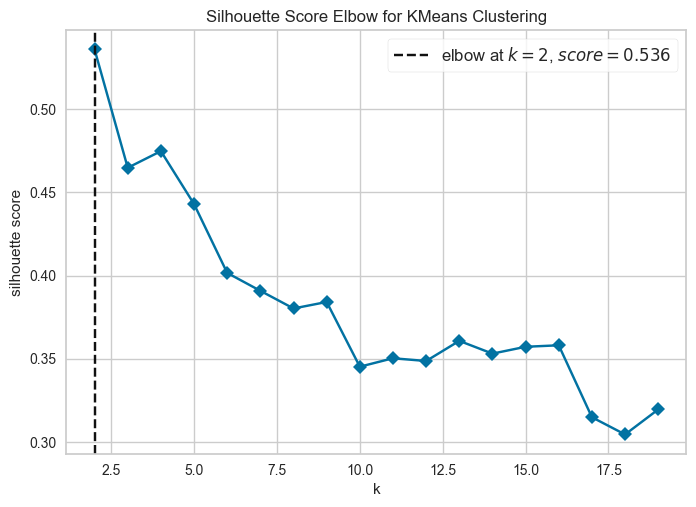

In [93]:
#Now we will check for two different hyperparamters value effect 

model = KMeans(random_state = 10, max_iter = 500, init = 'k-means++')

visualizer = KElbowVisualizer(model, k = (2,20), metric = 'silhouette', timings = False)
print('Elbow plot for standard scaler data')
visualizer.fit(minmax_df)
visualizer.poof()
plt.show()

For n_clusters = 2 The average silhouette_score is:  0.535888544052936
For n_clusters = 3 The average silhouette_score is:  0.46479982811211207
For n_clusters = 4 The average silhouette_score is:  0.47479527849897574
For n_clusters = 5 The average silhouette_score is:  0.4429787795230887
For n_clusters = 6 The average silhouette_score is:  0.4016097863623769
For n_clusters = 7 The average silhouette_score is:  0.3908543599528882
For n_clusters = 8 The average silhouette_score is:  0.38024699861297795
For n_clusters = 9 The average silhouette_score is:  0.38414949365333306
For n_clusters = 10 The average silhouette_score is:  0.34525305895953784


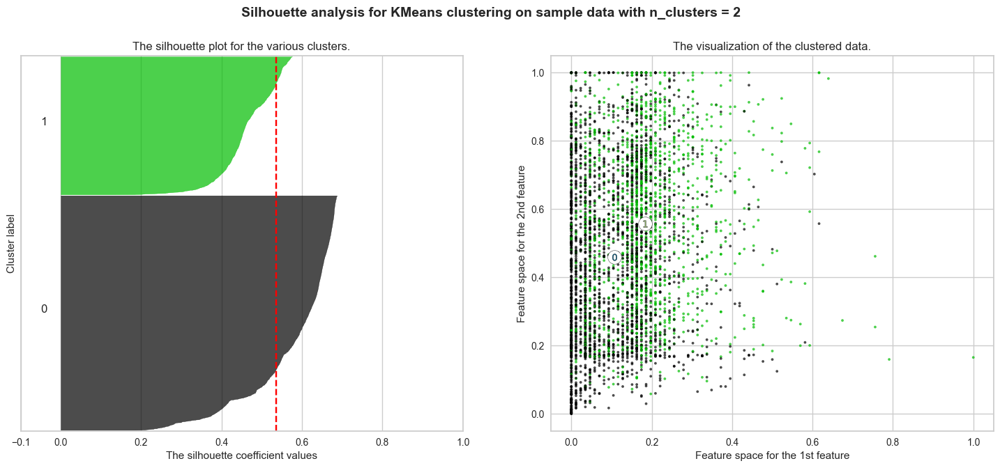

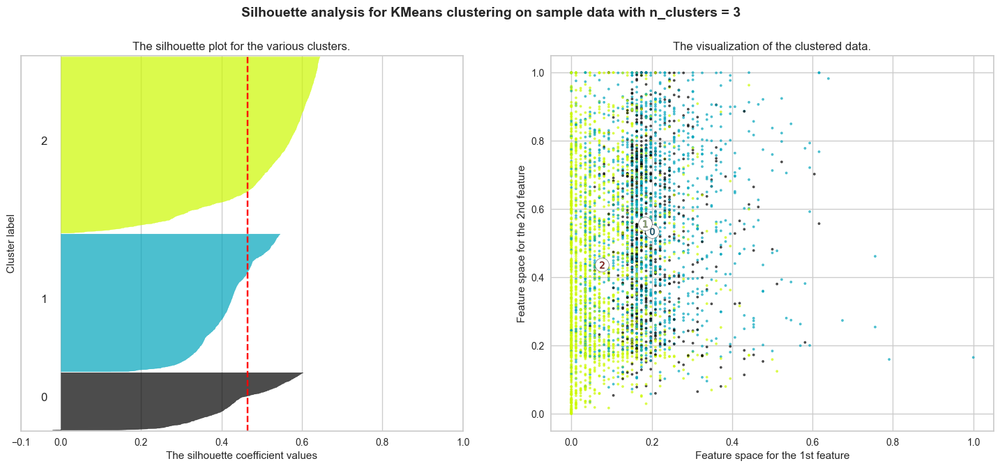

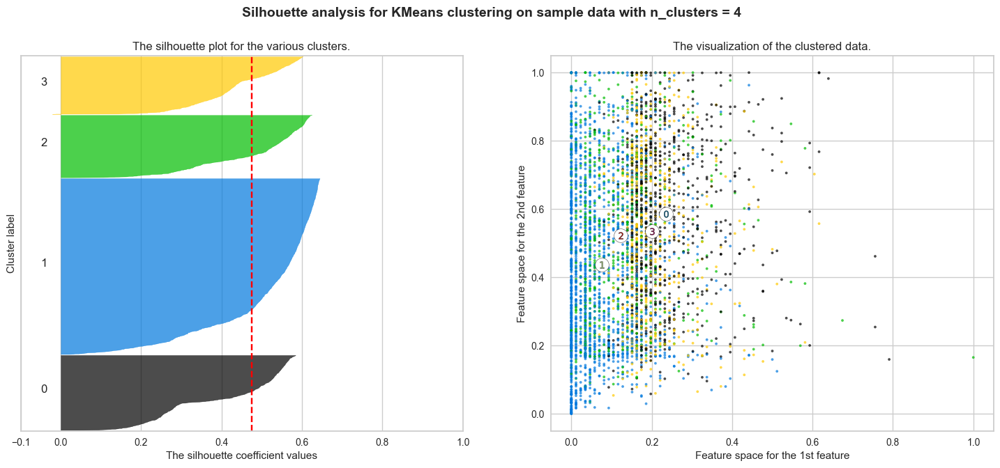

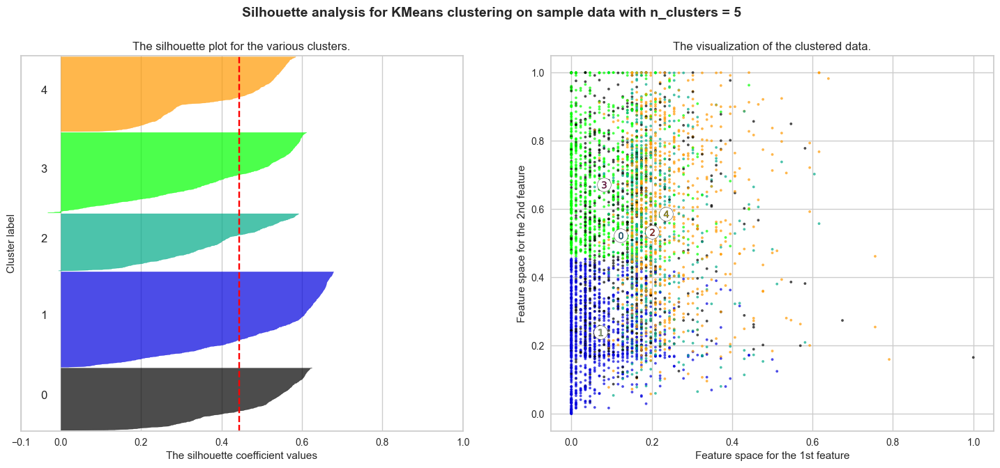

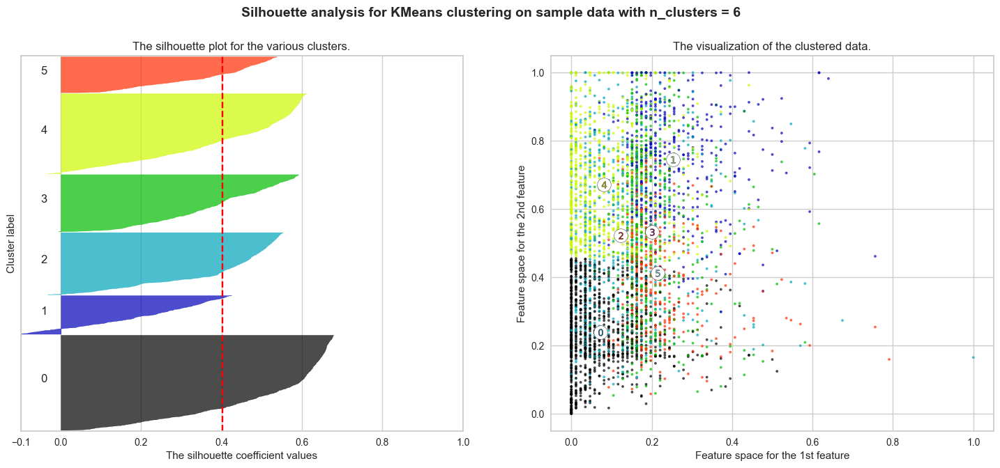

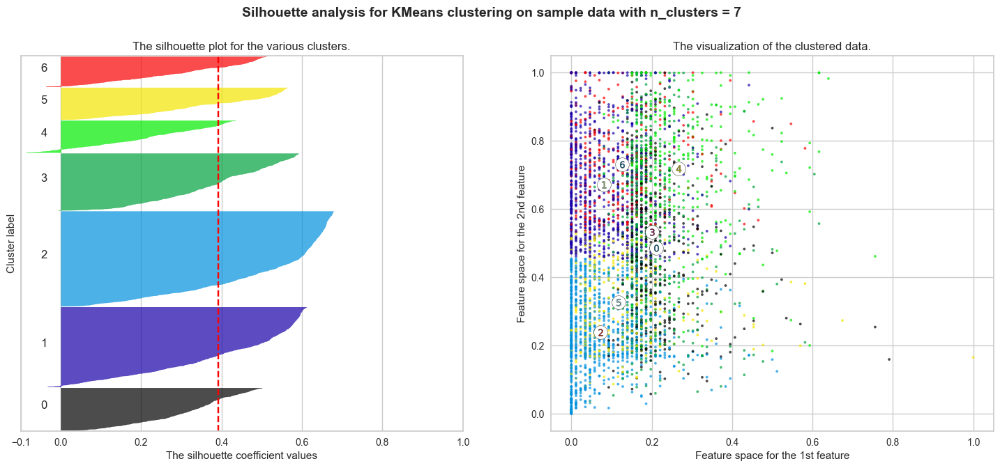

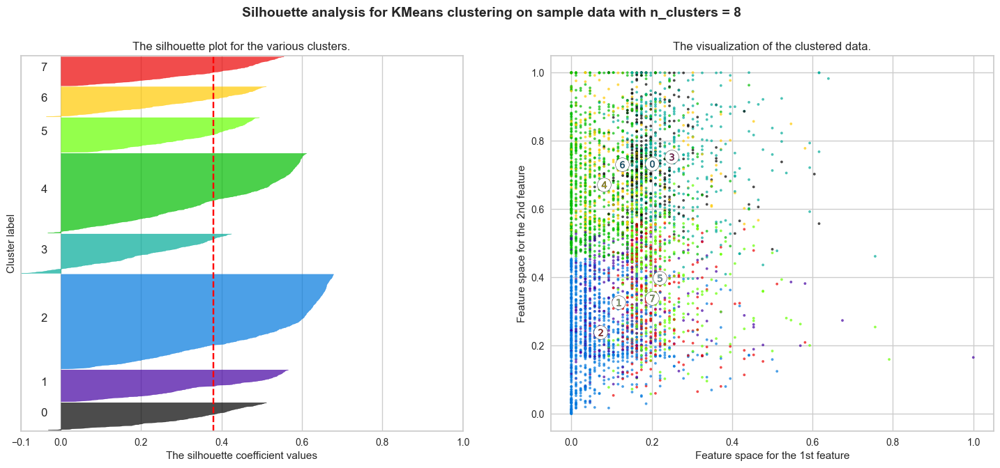

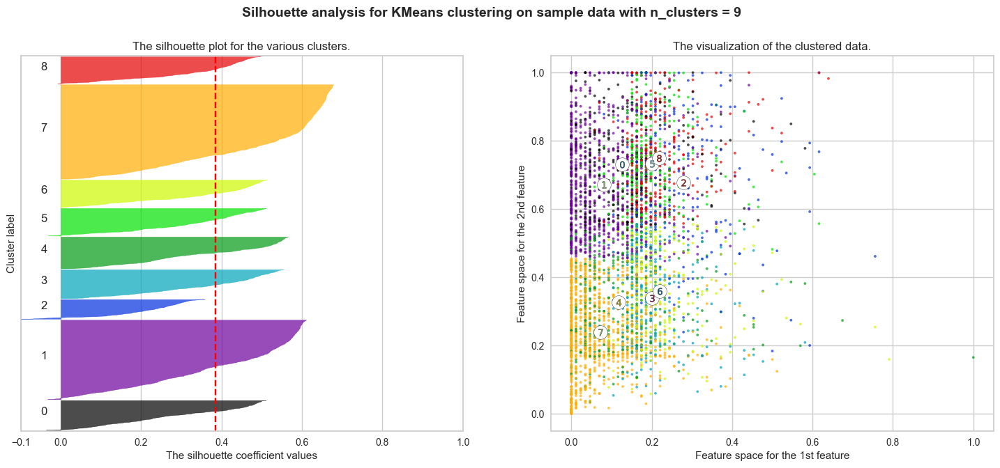

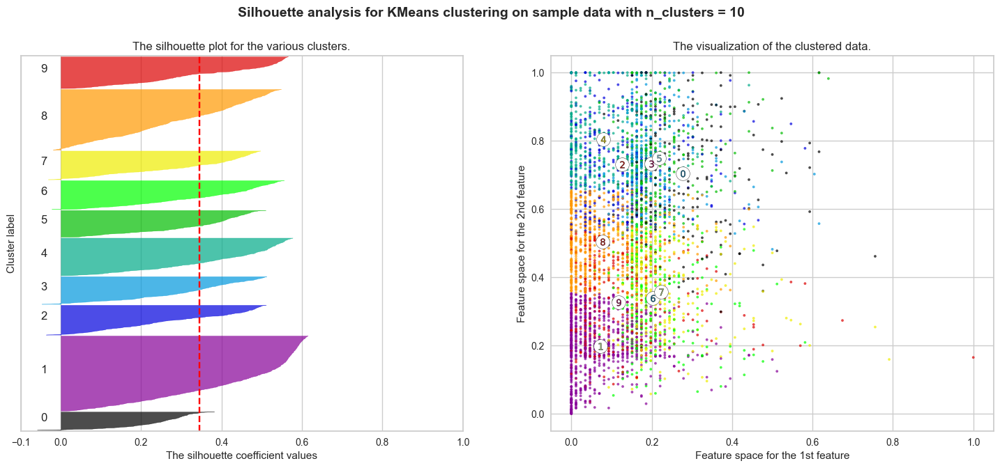

In [94]:
range_n_clusters = [2,3,4,5,6,7,8,9,10]

for n_clusters in range_n_clusters:
    # create a subplot with 1 row and 2 columns 
    fig, (ax1, ax2) = plt.subplots(1,2)
    fig.set_size_inches(18,7)

    # 1st plot:- silhouette plot
    ax1.set_xlim([-0.1,1])
    ax1.set_ylim([0, len(minmax_df) + (n_clusters +1)*10])


    clusterer = KMeans(n_clusters = n_clusters, random_state = 10)
    cluster_labels = clusterer.fit_predict(minmax_df)

    silhouette_avg = sil(minmax_df, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters, 
        "The average silhouette_score is: ",
        silhouette_avg,
    )

    sample_silhouette_values = silhouette_samples(minmax_df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):

        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels ==i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]

        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i)/n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor = color,
            edgecolor = color, 
            alpha = 0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10
        
    ax1.set_title('The silhouette plot for the various clusters.')
    ax1.set_xlabel('The silhouette coefficient values')
    ax1.set_ylabel('Cluster label')


    ax1.axvline(x = silhouette_avg, color = 'red', linestyle = '--')

    ax1.set_yticks([])
    ax1.set_xticks([-0.1,0,0.2,0.4,0.6,0.8,1])

    # 2nd plot 

    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        minmax_df[:,6], minmax_df[:,9],marker = '.', s = 30, lw = 0, alpha = 0.7, c = colors, edgecolor = 'k')

    centers = clusterer.cluster_centers_

    ax2.scatter(
        centers[:,6], centers[:,9],
        marker = 'o',
        c = 'white',
        alpha = 1,
        s = 200,
        edgecolor = 'k',
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[6],c[9], marker = '$%d$' % i, alpha =1, s = 50, edgecolor = 'k')

    ax2.set_title('The visualization of the clustered data.')
    ax2.set_xlabel('Feature space for the 1st feature')
    ax2.set_ylabel('Feature space for the 2nd feature')


    plt.suptitle(
        'Silhouette analysis for KMeans clustering on sample data with n_clusters = %d'
        % n_clusters,
        fontsize = 14,
        fontweight = 'bold'
    )
        
plt.show()


__Conclusion:__

Here, on MixMax Scaler applied data the silhouette score for the number of clusters 2 is the highest. Which means that the data is best fit for 2 clusters. 

But, if we look at the silhouette graph, then we can also see that for number of cluster 5, the width of the silhoette plots are most suitable. 

Now, it will all depend on the domanin knowledge to pick any one of these!

## Builing KMeans Cluster for K = 2 on MixMaxScaler Applied dataset

In [98]:
model_m = KMeans(n_clusters = 2, random_state = 0, init = 'k-means++')
y_pred = model_m.fit_predict(minmax_df)
y_pred

array([1, 1, 1, ..., 0, 1, 1])

In [99]:
y_pred.shape

(3998,)

In [100]:
model_m.labels_

array([1, 1, 1, ..., 0, 1, 1])

In [101]:
model_m.cluster_centers_

array([[ 5.69280197e-02,  2.15461508e-02,  4.15428764e-01,
         7.76502363e-03,  4.55773126e-03,  1.09621005e-01,
         1.83518364e-01,  2.78255837e-02,  4.90489598e-02,
         5.57398375e-01,  1.00000000e+00],
       [ 3.50949497e-02,  7.86125463e-03,  1.76400477e-01,
         6.95272149e-03,  2.18514104e-03,  3.88029372e-02,
         1.06355850e-01,  7.34601684e-03,  1.23162495e-02,
         4.60517912e-01, -3.27515792e-15]])

In [102]:
model_m.inertia_

823.5583625482057

In [103]:
df_m = data_new.copy()
df_m.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
ID,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0
2,19244,0,1,1,1,215,2,0,0,6968,0
3,41354,0,1,1,1,4123,4,0,0,7034,0
4,14776,0,1,1,1,500,1,0,0,6952,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1


In [104]:
df_m['Kmeans_label'] = model_m.labels_
df_m.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Kmeans_label
ID,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,1
2,19244,0,1,1,1,215,2,0,0,6968,0,1
3,41354,0,1,1,1,4123,4,0,0,7034,0,1
4,14776,0,1,1,1,500,1,0,0,6952,0,1
5,97752,0,4,1,1,43300,26,2077,4,6935,1,0


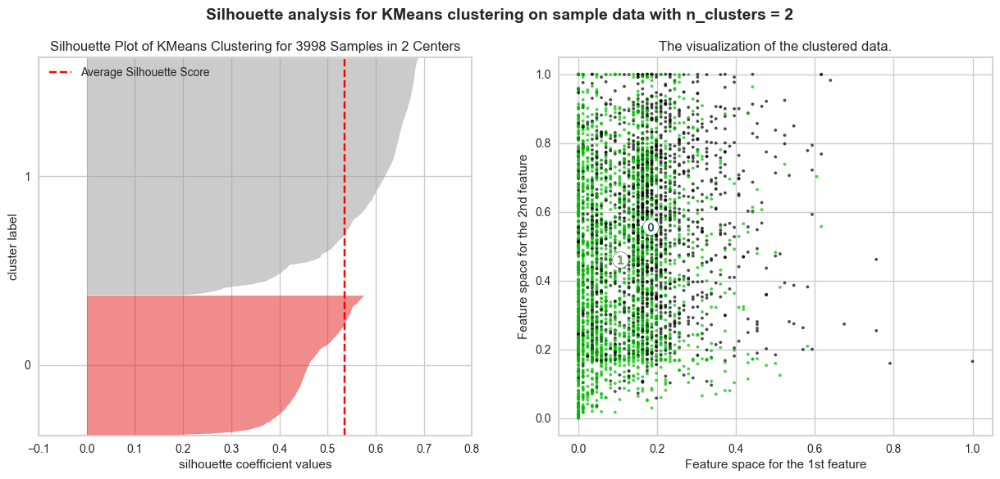

In [107]:
fig, (ax1, ax2) = plt.subplots(1,2,sharey = False)
fig.set_size_inches(15,6)

sil_vis1 = sv(model_m, ax = ax1)
sil_vis1.fit(minmax_df)

color = cm.nipy_spectral(model_m.labels_.astype(float)/ 2)
ax2.scatter(minmax_df[:,6], minmax_df[:,9], marker = '.', s = 30, lw = 0, alpha = 0.7,
            c = color, edgecolor = 'k')

centers1 = model_m.cluster_centers_

ax2.scatter(centers1[:,6], centers1[:,9], marker = 'o', c = 'white', alpha = 1, s = 200, edgecolor = 'k')

for i, c in enumerate(centers1):
    ax2.scatter(c[6], c[9], marker = '$%d$' % i, alpha = 1, s = 50, edgecolor = 'k')

ax2.set_title(label ="The visualization of the clustered data.")
ax2.set_xlabel("Feature space for the 1st feature")
ax2.set_ylabel("Feature space for the 2nd feature")

plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % 2),fontsize=14, fontweight='bold')

sil_vis1.show()
plt.show()

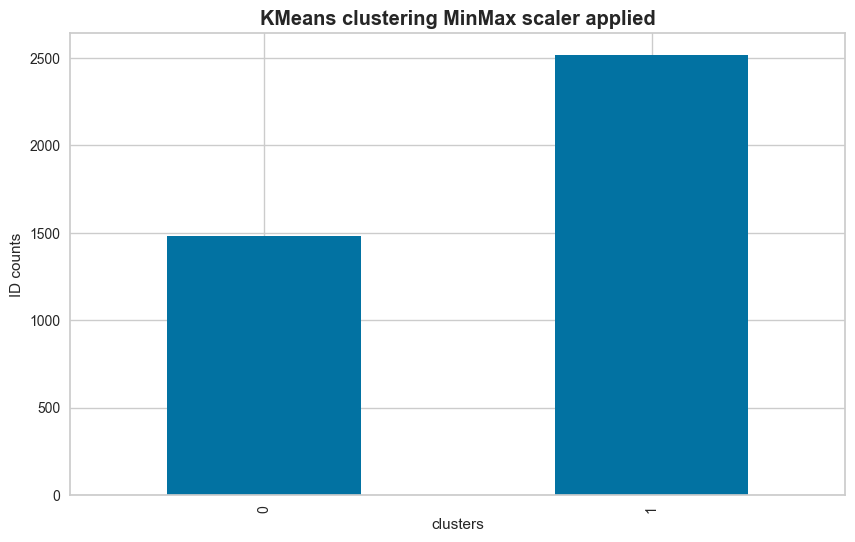

In [222]:
fig, ax = plt.subplots(figsize = (10,6))
df.groupby(df_m['Kmeans_label']).count()['Balance'].plot(kind = 'bar')
# the column 'Balance' is used for counting purpose and nothing more than that
plt.ylabel('ID counts')
plt.title('KMeans clustering MinMax scaler applied', fontsize = 'large', fontweight = 'bold')
plt.xlabel('clusters')
plt.show()

In [113]:
df_m.groupby('Kmeans_label').agg(['mean'])

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Kmeans_label,,,,,,,,,,,
0,97053.051317,240.196489,2.661715,1.015530,1.018231,28905.414585,15.782579,857.501013,2.599595,4625.062120,1.0
1,59831.203814,87.637267,1.705602,1.013905,1.008741,10231.752483,9.146603,226.382201,0.652761,3821.535558,0.0


__Conclusion:__

We can see it clustering into 2 groups 

Cluster 0 represent, those who earn the most out of the card and are frequent fliers. 

Whereas, cluster 1 represent, those who earn the least and are least frequent fliers.

# Hiearachical Clustering

## Dendogram on MinMaxScaler Applied Dataset

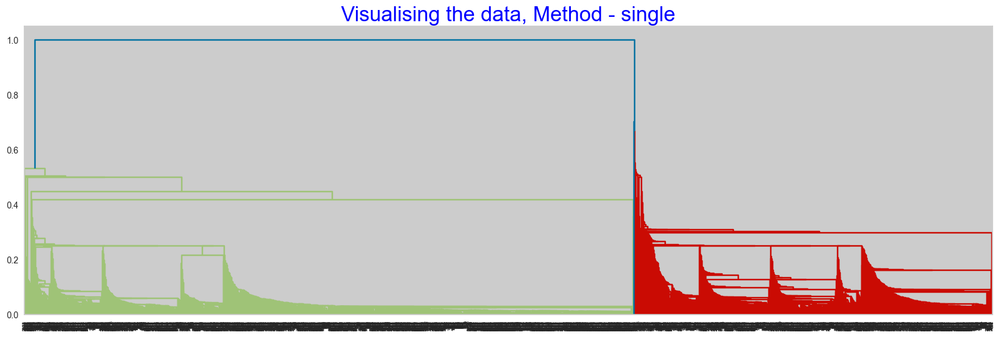

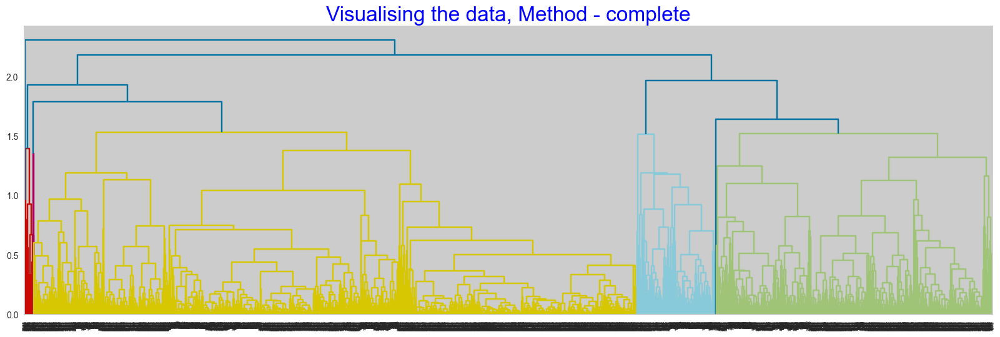

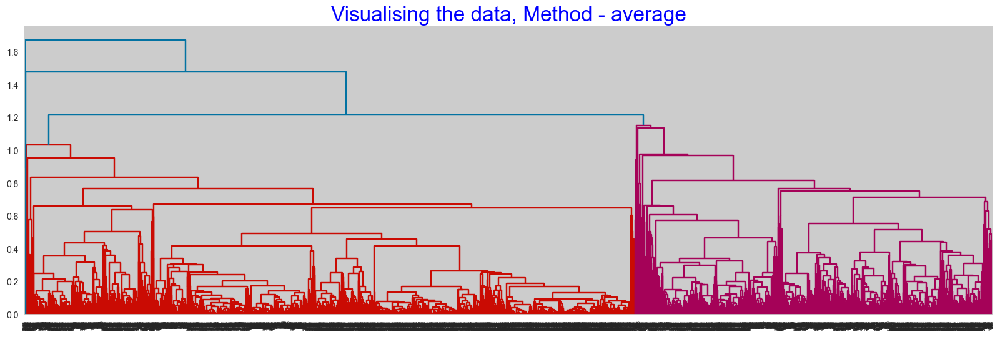

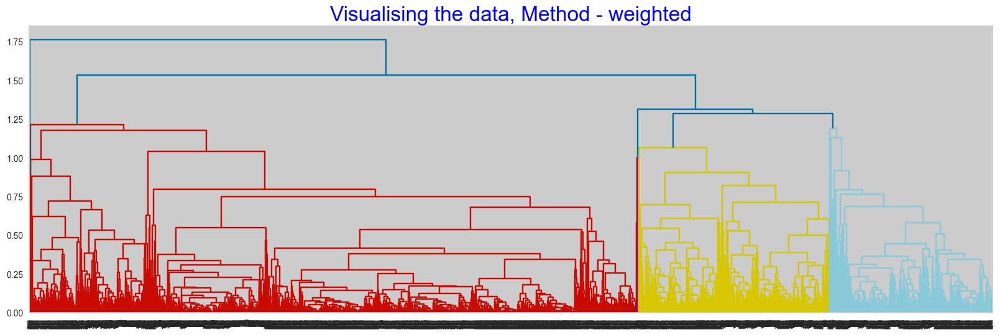

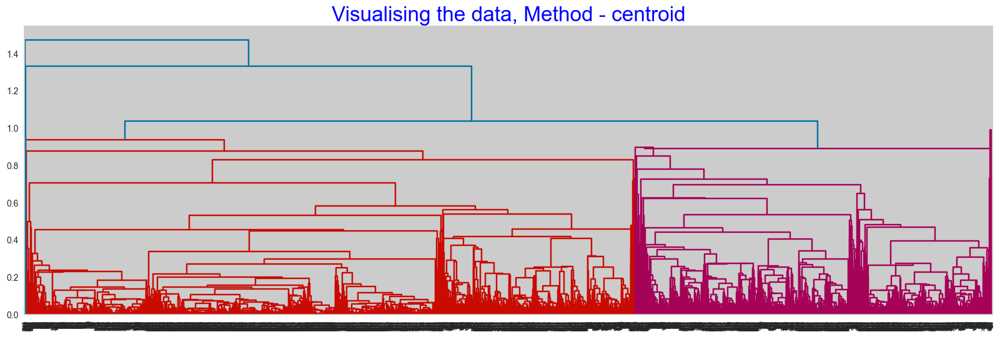

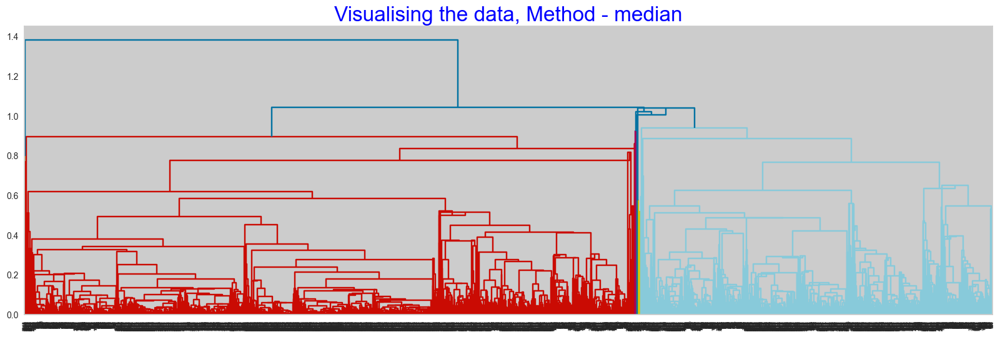

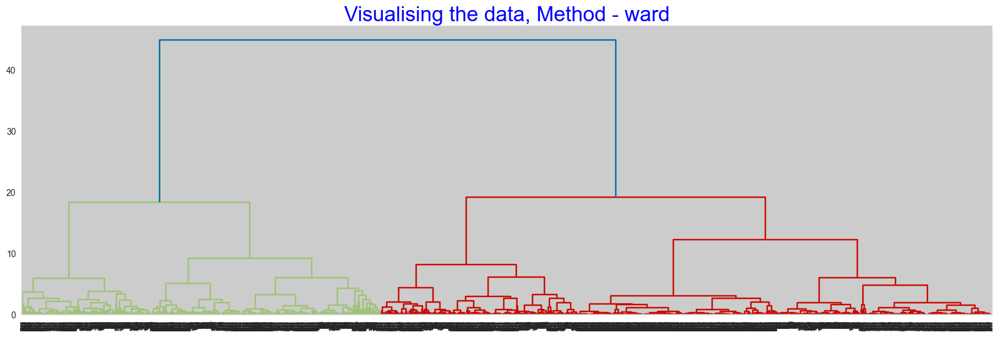

In [114]:
for methods in ['single','complete','average','weighted','centroid','median','ward']:
    plt.figure(figsize = (20, 6))

    dict = {'fontsize':24, 'fontweight':16, 'color': 'blue'}

    plt.title('Visualising the data, Method - {}'.format(methods), fontdict = dict)
    Dendrogram1 = sch.dendrogram(sch.linkage(minmax_df, method = methods, optimal_ordering = False)) 

In [117]:
n_clusters = [2,3,4,5,6,7,8]

for linkages in ['ward','complete','average','single']:
    for n in n_clusters:
        hie_cluster1 = AgglomerativeClustering(n_clusters = n, linkage = linkages)
        hie_labels1 = hie_cluster1.fit_predict(minmax_df)
        s_score1 = sil(minmax_df, hie_labels1)
        print('for n_clusters = ', n, 'the average silhouette_score with linkage- ', linkages, ':', s_score1)
    print()    

for n_clusters =  2 the average silhouette_score with linkage-  ward : 0.535888544052936
for n_clusters =  3 the average silhouette_score with linkage-  ward : 0.4354523188194701
for n_clusters =  4 the average silhouette_score with linkage-  ward : 0.42489181550394106
for n_clusters =  5 the average silhouette_score with linkage-  ward : 0.39403156026334374
for n_clusters =  6 the average silhouette_score with linkage-  ward : 0.3522374213416886
for n_clusters =  7 the average silhouette_score with linkage-  ward : 0.3482214804548273
for n_clusters =  8 the average silhouette_score with linkage-  ward : 0.35135819381335376

for n_clusters =  2 the average silhouette_score with linkage-  complete : 0.4703657329091562
for n_clusters =  3 the average silhouette_score with linkage-  complete : 0.5318364582439801
for n_clusters =  4 the average silhouette_score with linkage-  complete : 0.4645451427805366
for n_clusters =  5 the average silhouette_score with linkage-  complete : 0.41668148

So, if we go by ward method, we would have 2 as optimal number of clusters. Here, the ward linkage tries to minimise the within cluster variants. 

## Dendrogram on Standard Scaler Applied on Data

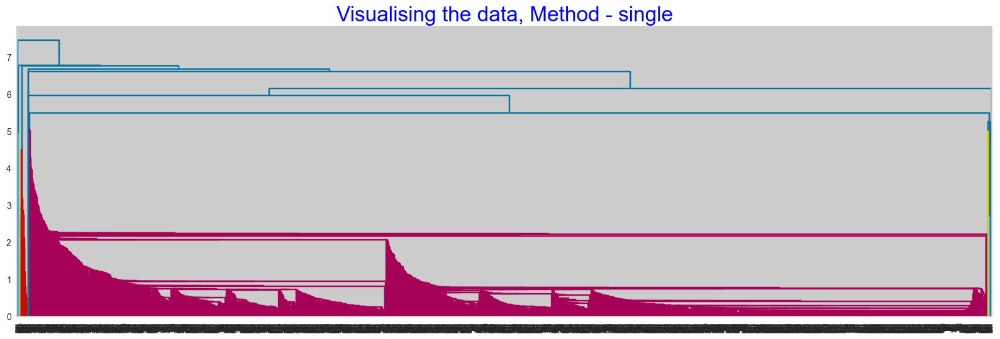

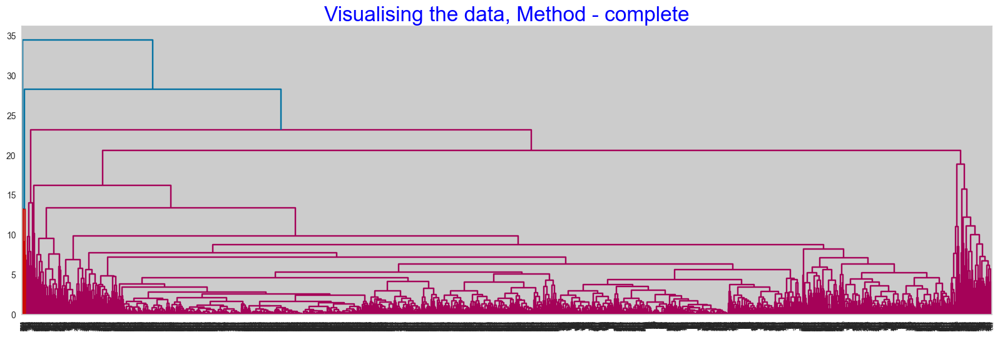

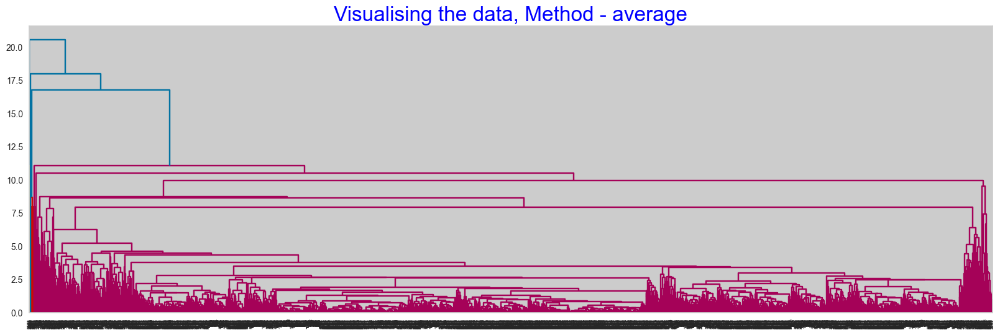

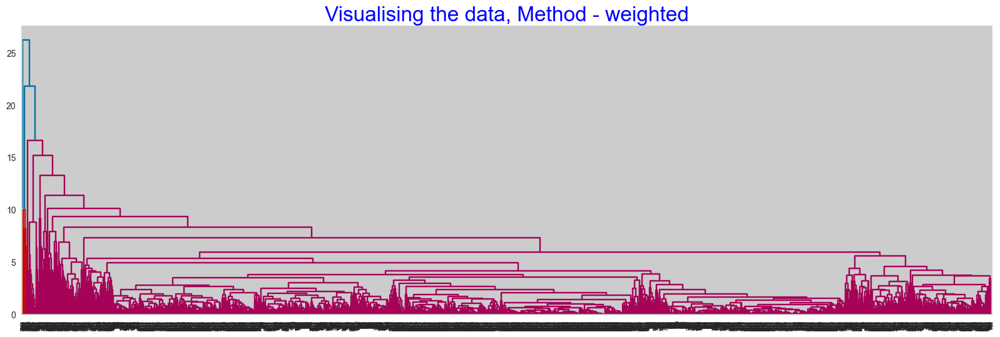

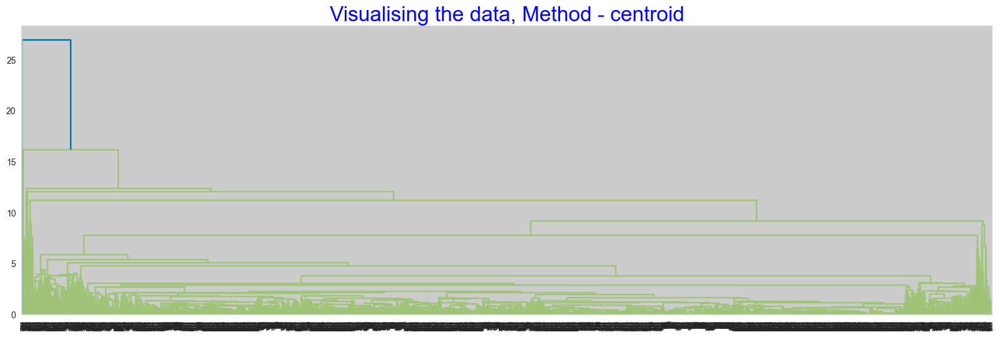

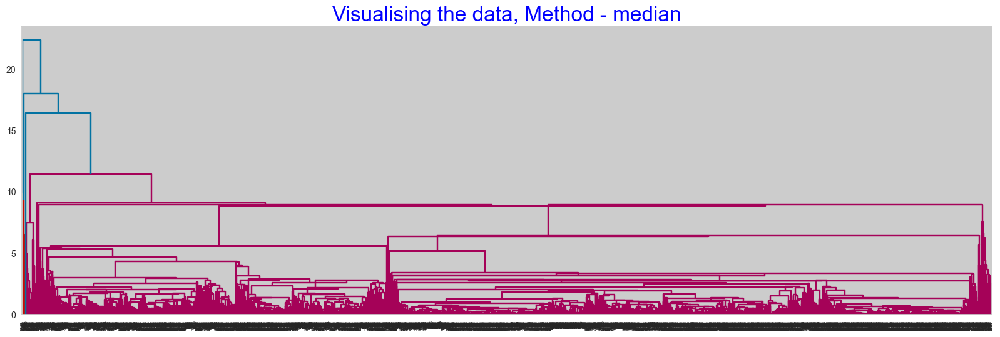

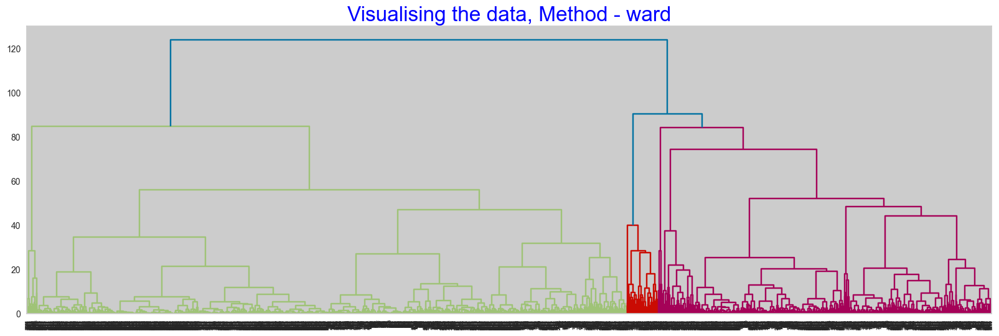

In [118]:
for methods in ['single','complete','average','weighted','centroid','median','ward']:
    plt.figure(figsize = (20, 6))

    dict = {'fontsize':24, 'fontweight':16, 'color': 'blue'}

    plt.title('Visualising the data, Method - {}'.format(methods), fontdict = dict)
    Dendrogram1 = sch.dendrogram(sch.linkage(std_df, method = methods, optimal_ordering = False)) 

In [119]:
n_clusters = [2,3,4,5,6,7,8]

for linkages in ['ward','complete','average','single']:
    for n in n_clusters:
        hie_cluster1 = AgglomerativeClustering(n_clusters = n, linkage = linkages)
        hie_labels1 = hie_cluster1.fit_predict(std_df)
        s_score1 = sil(minmax_df, hie_labels1)
        print('for n_clusters = ', n, 'the average silhouette_score with linkage- ', linkages, ':', s_score1)
    print()    

for n_clusters =  2 the average silhouette_score with linkage-  ward : 0.32842534355042224
for n_clusters =  3 the average silhouette_score with linkage-  ward : 0.28935799041692717
for n_clusters =  4 the average silhouette_score with linkage-  ward : 0.26813470352089386
for n_clusters =  5 the average silhouette_score with linkage-  ward : 0.26965054408224964
for n_clusters =  6 the average silhouette_score with linkage-  ward : 0.2586109429498731
for n_clusters =  7 the average silhouette_score with linkage-  ward : 0.17368715083786257
for n_clusters =  8 the average silhouette_score with linkage-  ward : 0.181315602199083

for n_clusters =  2 the average silhouette_score with linkage-  complete : 0.4703657329091562
for n_clusters =  3 the average silhouette_score with linkage-  complete : 0.33857622334847515
for n_clusters =  4 the average silhouette_score with linkage-  complete : 0.24968726781468212
for n_clusters =  5 the average silhouette_score with linkage-  complete : 0.1898

__Conclusion:__

The max socre here also is with the number of clusters being 2!

## PCA

### Running PCA on standardized data

In [120]:
from sklearn.decomposition import PCA
pca_std = PCA(random_state = 10, n_components = 0.95)
pca_std_df = pca_std.fit_transform(std_df)

In [122]:
print(pca_std.singular_values_)  #eigenvalues...

[114.59929366  83.12095737  64.93711956  63.52257567  61.95910679
  60.39325992  56.7960262   49.8137685   37.95289819]


In [123]:
print(pca_std.explained_variance_ratio_*100) # variance containing in each formed PCA

[29.8626543  15.71034052  9.58849765  9.17530952  8.72920759  8.29356916
  7.33500521  5.64239286  3.27532512]


In [126]:
# cummulative variance ratio

cum_variance = np.cumsum(pca_std.explained_variance_ratio_*100)
cum_variance

array([29.8626543 , 45.57299482, 55.16149247, 64.33680198, 73.06600957,
       81.35957873, 88.69458394, 94.3369768 , 97.61230192])

by applying PCA on standardizede data with 95% variance it gives 9 PCA components.

#### Silhouette Score Method for PCA standard scaled data

In [127]:
n_clusters = [2,3,4,5,6,7,8,9,10,11,12,13,14,15]

for linkages in ['ward','complete','average','single']:
    for n in n_clusters:
        hie_cluster1 = AgglomerativeClustering(n_clusters = n, linkage = linkages)
        hie_labels1 = hie_cluster1.fit_predict(pca_std_df)
        s_score1 = sil(minmax_df, hie_labels1)
        print('for n_clusters = ', n, 'the average silhouette_score with linkage- ', linkages, ':', s_score1)
    print()    

for n_clusters =  2 the average silhouette_score with linkage-  ward : 0.32370036953827075
for n_clusters =  3 the average silhouette_score with linkage-  ward : 0.2593036488699251
for n_clusters =  4 the average silhouette_score with linkage-  ward : 0.25863812645027817
for n_clusters =  5 the average silhouette_score with linkage-  ward : 0.26061078996796055
for n_clusters =  6 the average silhouette_score with linkage-  ward : 0.33551686277868215
for n_clusters =  7 the average silhouette_score with linkage-  ward : 0.3263659969905705
for n_clusters =  8 the average silhouette_score with linkage-  ward : 0.3233546752367699
for n_clusters =  9 the average silhouette_score with linkage-  ward : 0.29329918058666676
for n_clusters =  10 the average silhouette_score with linkage-  ward : 0.28466570981336825
for n_clusters =  11 the average silhouette_score with linkage-  ward : 0.22689034616107118
for n_clusters =  12 the average silhouette_score with linkage-  ward : 0.2465668802807472


#### Run Hierarchical Clustering (Agglomerative Clustering)

In [155]:
agg_clustering = AgglomerativeClustering(n_clusters = 6, linkage = 'ward') #picking the best score value for ward linkage
y_pred_hie = agg_clustering.fit_predict(pca_std_df)
print(y_pred_hie.shape)
y_pred_hie

(3998,)


array([1, 1, 1, ..., 0, 1, 1], dtype=int64)

In [149]:
np.unique(y_pred_hie)

array([0, 1, 2, 3, 4, 5], dtype=int64)

In [150]:
agg_clustering.n_clusters_

6

In [151]:
(sil(pca_std_df, agg_clustering.labels_)*100).round(3)

24.288

In [152]:
df_agg_new = data_new.copy()
df_agg_new['Hierarchical_labels'] = agg_clustering.labels_
df_agg_new.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchical_labels
ID,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,1
2,19244,0,1,1,1,215,2,0,0,6968,0,1
3,41354,0,1,1,1,4123,4,0,0,7034,0,1
4,14776,0,1,1,1,500,1,0,0,6952,0,1
5,97752,0,4,1,1,43300,26,2077,4,6935,1,2


In [153]:
df_agg_new.groupby('Hierarchical_labels').agg(['mean'])

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Hierarchical_labels,,,,,,,,,,,
0,67704.356846,425.426556,2.119502,1.000000,1.000000,16593.541909,11.837344,606.787552,1.825726,4243.910373,0.904564
1,35565.475331,1.895909,1.071600,1.000000,1.000000,2692.451264,5.929603,98.201564,0.332732,3485.887485,0.008424
2,138267.578585,32.603143,3.591356,1.000000,1.000000,39062.095285,18.860511,442.873281,1.383104,4982.896857,0.300589
3,68876.581395,23.255814,1.139535,2.348837,1.000000,14689.837209,17.534884,582.627907,2.209302,3968.930233,0.395349
4,129951.388889,65.666667,3.388889,1.000000,3.722222,86259.888889,26.222222,422.222222,1.333333,4488.777778,0.500000
5,145767.807692,483.692308,2.576923,1.000000,1.000000,41204.115385,35.596154,8882.211538,23.326923,4557.961538,0.865385


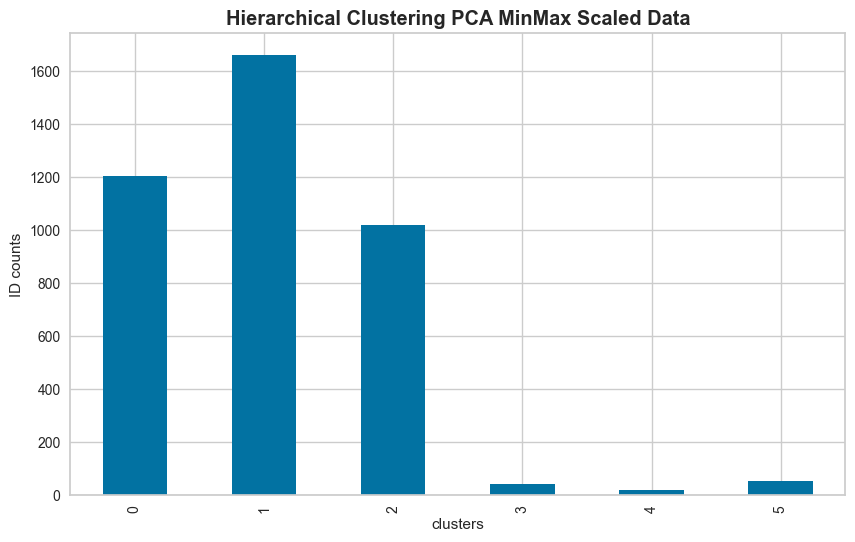

In [154]:
fig, ax = plt.subplots(figsize = (10,6))
df_agg_new.groupby(df_agg_new['Hierarchical_labels']).count()['Balance'].plot(kind = 'bar')
# the column 'Balance' is used for counting purpose and nothing more than that
plt.ylabel('ID counts')
plt.title('Hierarchical Clustering PCA MinMax Scaled Data', fontsize = 'large', fontweight = 'bold')
plt.xlabel('clusters')
plt.show()

### Running PCA of MinMaxScalar data

In [157]:
pca_minmax = PCA(random_state = 10, n_components = 0.95)
pca_minmax_df = pca_minmax.fit_transform(minmax_df)

In [158]:
print(pca_minmax.singular_values_)  #eigenvalues

[32.61283384 20.38274997 14.94964196  6.55127594]


In [161]:
print(pca_minmax.explained_variance_ratio_*100)

[58.10519044 22.69673608 12.20954379  2.34471271]


In [162]:
print(np.cumsum(pca_minmax.explained_variance_ratio_*100))

[58.10519044 80.80192652 93.01147031 95.35618302]


Application of PCA on MinMaxScalar transformation gives 4 PCA components and we'd be needing all 4, to explain 95% variance.

#### Silhouette Score method for PCA MinMax Scaled data

In [163]:
n_clusters = [2,3,4,5,6,7,8,9,10,11,12,13,14,15]

for linkages in ['ward','complete','average','single']:
    for n in n_clusters:
        hie_cluster1 = AgglomerativeClustering(n_clusters = n, linkage = linkages)
        hie_labels1 = hie_cluster1.fit_predict(pca_minmax_df)
        s_score1 = sil(pca_minmax_df, hie_labels1)
        print('for n_clusters = ', n, 'the average silhouette_score with linkage- ', linkages, ':', s_score1)
    print()    

for n_clusters =  2 the average silhouette_score with linkage-  ward : 0.557020311332076
for n_clusters =  3 the average silhouette_score with linkage-  ward : 0.46680187576896975
for n_clusters =  4 the average silhouette_score with linkage-  ward : 0.4605211923296594
for n_clusters =  5 the average silhouette_score with linkage-  ward : 0.4061624735605504
for n_clusters =  6 the average silhouette_score with linkage-  ward : 0.37328148460228744
for n_clusters =  7 the average silhouette_score with linkage-  ward : 0.36806370685736245
for n_clusters =  8 the average silhouette_score with linkage-  ward : 0.3676909449537469
for n_clusters =  9 the average silhouette_score with linkage-  ward : 0.3656095623148135
for n_clusters =  10 the average silhouette_score with linkage-  ward : 0.37991118464757884
for n_clusters =  11 the average silhouette_score with linkage-  ward : 0.36867643938347905
for n_clusters =  12 the average silhouette_score with linkage-  ward : 0.37970092435872754
fo

#### Run Hierarchical Clustering (Agglomerative Clustering)

In [165]:
agg_clustering = AgglomerativeClustering(n_clusters = 2, linkage = 'ward')
y_pred_hie = agg_clustering.fit_predict(pca_minmax_df)
print(y_pred_hie.shape)
y_pred_hie

(3998,)


array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [166]:
agg_clustering.n_clusters_

2

In [167]:
(sil(pca_minmax_df, agg_clustering.labels_)*100).round(3)

55.702

In [172]:
df_agg2 = data_new.copy()
df_agg2['hie_labels'] = agg_clustering.labels_
df_agg2.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,hie_labels
ID,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,0
2,19244,0,1,1,1,215,2,0,0,6968,0,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,0
4,14776,0,1,1,1,500,1,0,0,6952,0,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,1


In [174]:
df_agg2.groupby('hie_labels').agg(['mean'])

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
hie_labels,,,,,,,,,,,
0,59831.203814,87.637267,1.705602,1.013905,1.008741,10231.752483,9.146603,226.382201,0.652761,3821.535558,0.0
1,97053.051317,240.196489,2.661715,1.015530,1.018231,28905.414585,15.782579,857.501013,2.599595,4625.062120,1.0


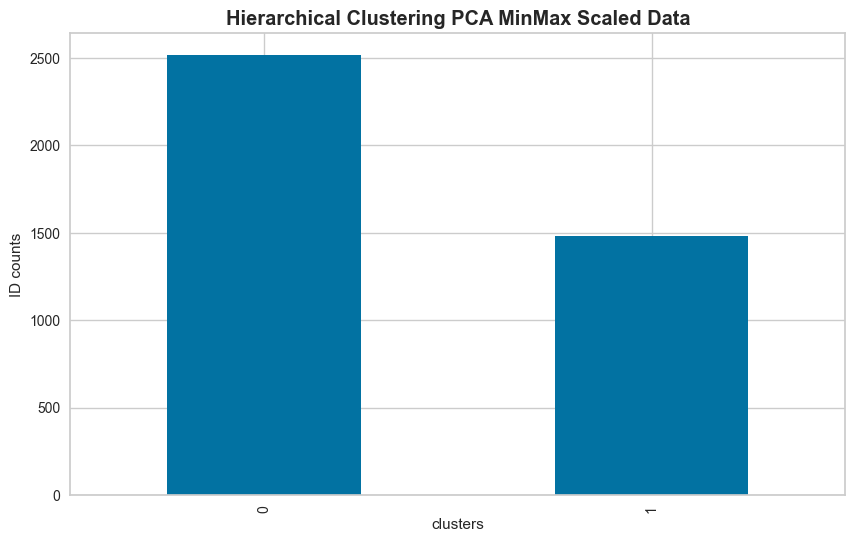

In [175]:
fig, ax = plt.subplots(figsize = (10,6))
df_agg_new.groupby(df_agg2['hie_labels']).count()['Balance'].plot(kind = 'bar')
# the column 'Balance' is used for counting purpose and nothing more than that
plt.ylabel('ID counts')
plt.title('Hierarchical Clustering PCA MinMax Scaled Data', fontsize = 'large', fontweight = 'bold')
plt.xlabel('clusters')
plt.show()

# DBSCAN

We dont need to know the number of cluster in advance to use DBSCAN, all we need is a function to calculate the distance and we also need to tell the algorithm what is considered close. So, DBSCAN can produce reasonable results.

## DBSCAN of standard scaled data

We need to look for the right set of the parameters

In [176]:
from itertools import product

In [177]:
eps_values = np.arange(0.25, 3, 0.25)
min_samples = np.arange(3,23)
DBSCAN_params = list(product(eps_values, min_samples))

In [180]:
no_of_clusters = []
sil_score = []

for p in DBSCAN_params:
    DBS_clustering = DBSCAN(eps = p[0], min_samples = p[1]).fit(std_df)
    no_of_clusters.append(len(np.unique(DBS_clustering.labels_)))
    sil_score.append(sil(std_df, DBS_clustering.labels_))

A heatplot below shows how many clusters were generated by the algorithm for the respective parameters combinations.


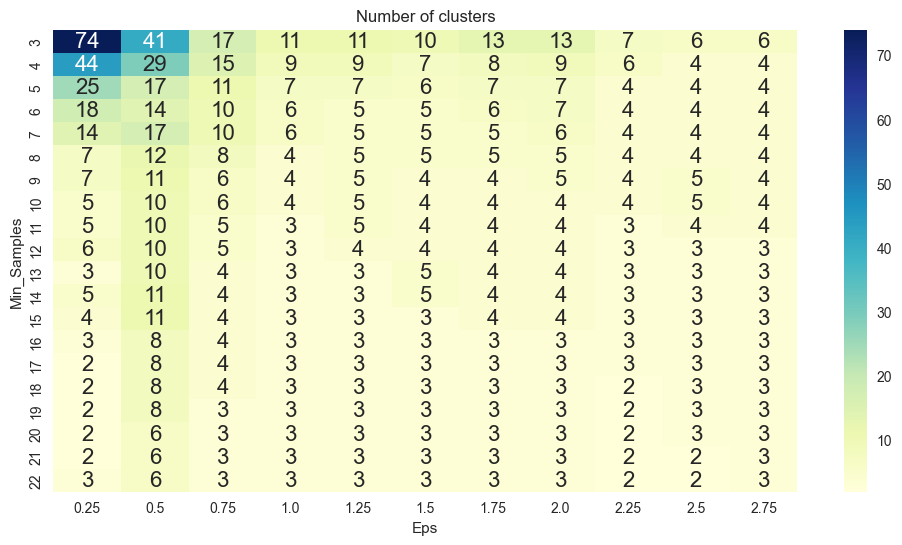

In [186]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns = ['Eps','Min_Samples'])
tmp['No_of_clusters'] = no_of_clusters

pivot_1 = pd.pivot_table(tmp, values = 'No_of_clusters', index = 'Min_Samples', columns = 'Eps')

fig, ax = plt.subplots(figsize = (12,6))
sns.heatmap(pivot_1, annot = True, annot_kws = {'size': 16}, cmap = 'YlGnBu', ax = ax)
ax.set_title('Number of clusters')
print('A heatplot below shows how many clusters were generated by the algorithm for the respective parameters combinations.')
plt.show()

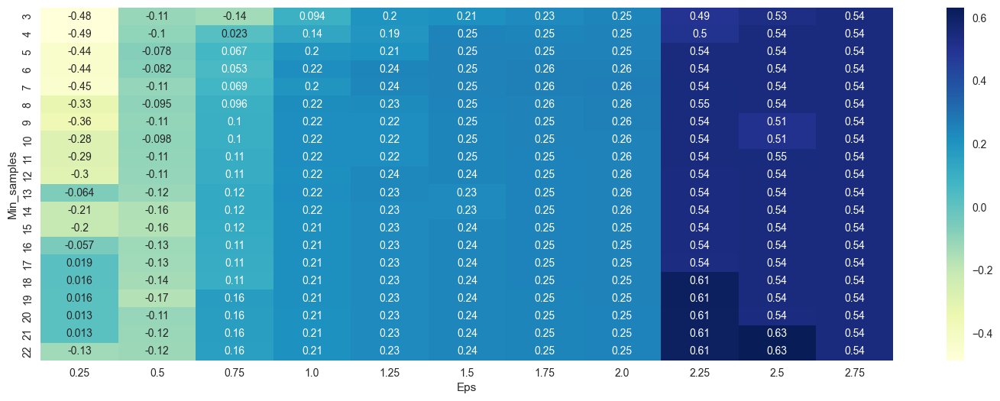

In [187]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns = ['Eps','Min_samples'])
tmp['Sil_score'] = sil_score

pivot_1 = pd.pivot_table(tmp, values = 'Sil_score', index = 'Min_samples', columns = 'Eps')

fig, ax = plt.subplots(figsize = (18,6))
sns.heatmap(pivot_1, annot = True, annot_kws = {'size':10}, cmap = 'YlGnBu', ax = ax)
plt.show()

__Global maxima is 0.63 for eps = 2.5 and min_samples = 21 and 22__

In [191]:
sil_avg = []
max_value = [0,0,0,0]

for i in eps_values:
    for j in min_samples:

        db = DBSCAN(min_samples = j, eps = i).fit(std_df)

        core_samples_mask = np.zeros_like(db.labels_, dtype = bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_

        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        silhouette_avg = sil(std_df, labels)
        if silhouette_avg > max_value[3]:
            max_value = (i, j, n_clusters_, silhouette_avg)
        sil_avg.append(silhouette_avg)

print('Epsilon=', max_value[0],
     '\nMin_Sample=', max_value[1],
     '\nNumber of clusters=', max_value[2],
     '\nAverage silhouette score = %.4f' %max_value[3])

Epsilon= 2.5 
Min_Sample= 21 
Number of clusters= 1 
Average silhouette score = 0.6319


In [192]:
sil_avg = []
max_value = [0,0,0,0]

for i in eps_values:
    for j in min_samples:

        db = DBSCAN(min_samples = j, eps = i).fit(std_df)

        core_samples_mask = np.zeros_like(db.labels_, dtype = bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_

        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        silhouette_avg = sil(std_df, labels)
        if (silhouette_avg > max_value[3] and n_clusters_ > 1):
            max_value = (i, j, n_clusters_, silhouette_avg)
        sil_avg.append(silhouette_avg)

print('Epsilon=', max_value[0],
     '\nMin_Sample=', max_value[1],
     '\nNumber of clusters=', max_value[2],
     '\nAverage silhouette score = %.4f' %max_value[3])

Epsilon= 2.5 
Min_Sample= 11 
Number of clusters= 3 
Average silhouette score = 0.5452


### Note: 

I had to re-run the code with a different set of conditions, because I believe that number of clusters should be more than just 1! 

So, I'd rather choose epsilon to be 2.5 and min_sample to be 11 to get the next best silhouette score of 0.54 instead of 0.63, because we I am to put eveything in one cluster, then there would be no point of classification!

### Run DBSCAN on standard scaled data with optimal min_samples and epsilon values

In [195]:
dbscan = DBSCAN(eps = 2.5, min_samples = 11)
dbscan.fit(std_df)

DBSCAN(eps=2.5, min_samples=11)

In [196]:
dbscan.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [197]:
df_db = data_new.copy()
df_db['DBSCAN_labels'] = dbscan.labels_
df.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
ID,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0
2,19244,0,1,1,1,215,2,0,0,6968,0
3,41354,0,1,1,1,4123,4,0,0,7034,0
4,14776,0,1,1,1,500,1,0,0,6952,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1


In [198]:
np.unique(df_db['DBSCAN_labels'])

array([-1,  0,  1,  2], dtype=int64)

In [200]:
df_db.groupby('DBSCAN_labels').agg(['mean'])

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
DBSCAN_labels,,,,,,,,,,,
-1,264518.142857,1698.244898,2.734694,1.088435,1.333333,54164.047619,27.224490,4264.843537,12.176871,4882.829932,0.795918
0,66560.659942,85.583442,2.043228,1.000000,1.000000,15779.154310,10.981137,316.303642,0.964894,4091.631386,0.354991
1,39644.434783,0.000000,1.000000,2.000000,1.000000,8962.478261,13.739130,221.739130,0.782609,3846.304348,0.304348
2,42971.000000,0.000000,1.000000,3.000000,1.000000,14996.000000,14.818182,36.363636,0.181818,4047.636364,0.181818


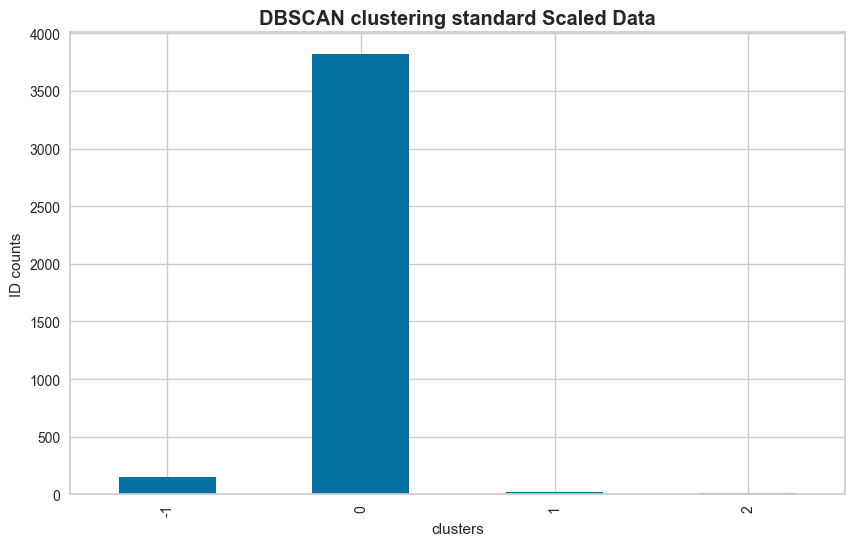

In [213]:
fig, ax = plt.subplots(figsize = (10,6))
df_db.groupby(df_db['DBSCAN_labels']).count()['Balance'].plot(kind = 'bar')
# the column 'Balance' is used for counting purpose and nothing more than that
plt.ylabel('ID counts')
plt.title('DBSCAN clustering standard Scaled Data', fontsize = 'large', fontweight = 'bold')
plt.xlabel('clusters')
plt.show()

Well, apparaently only one cluster is taking almost all of the points into it's cluster. So, there was no point choosing to go with 3 clusters. So, we can say that, the result in that case would also be similar to this.

## DBSCAN on MinMax Scaled Data

In [203]:
eps_values = np.arange(0.25,1.25,0.25) # eps values to be investigated
min_samples = np.arange(3,23) # min_samples values to be investigated
DBSCAN_params = list(product(eps_values, min_samples))


no_of_clusters = []
sil_score = []

for p in DBSCAN_params:
    DBS_clustering = DBSCAN(eps = p[0], min_samples = p[1]).fit(minmax_df)
    no_of_clusters.append(len(np.unique(DBS_clustering.labels_)))
    sil_score.append(sil(std_df, DBS_clustering.labels_))

A heatplot below shows how many clusters were generated by the algorithm for the respective parameters combinations.


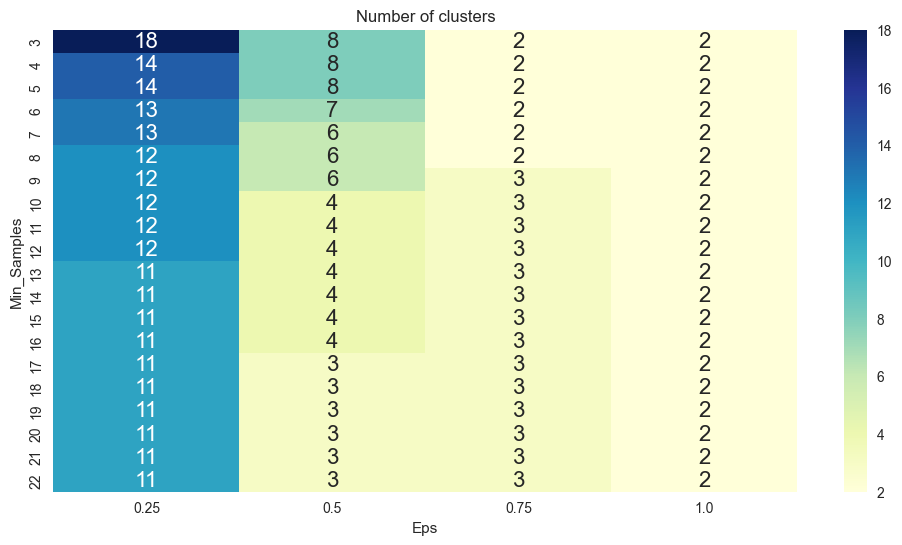

In [204]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns = ['Eps','Min_Samples'])
tmp['No_of_clusters'] = no_of_clusters

pivot_1 = pd.pivot_table(tmp, values = 'No_of_clusters', index = 'Min_Samples', columns = 'Eps')

fig, ax = plt.subplots(figsize = (12,6))
sns.heatmap(pivot_1, annot = True, annot_kws = {'size': 16}, cmap = 'YlGnBu', ax = ax)
ax.set_title('Number of clusters')
print('A heatplot below shows how many clusters were generated by the algorithm for the respective parameters combinations.')
plt.show()

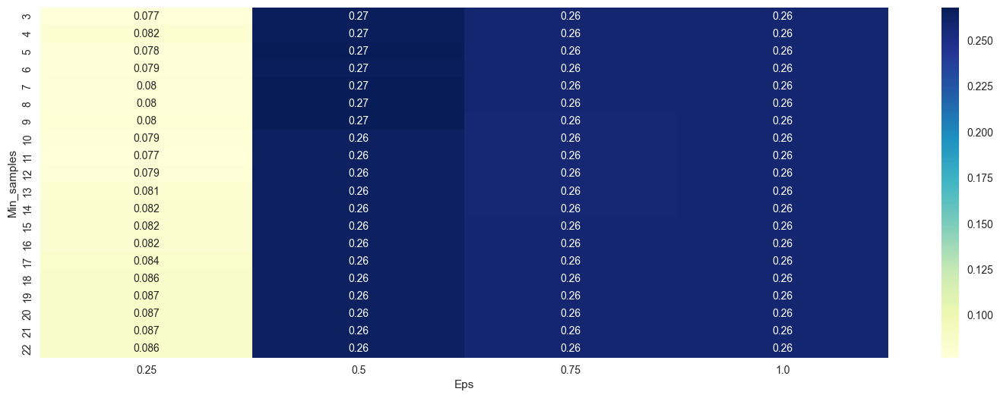

In [205]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns = ['Eps','Min_samples'])
tmp['Sil_score'] = sil_score

pivot_1 = pd.pivot_table(tmp, values = 'Sil_score', index = 'Min_samples', columns = 'Eps')

fig, ax = plt.subplots(figsize = (18,6))
sns.heatmap(pivot_1, annot = True, annot_kws = {'size':10}, cmap = 'YlGnBu', ax = ax)
plt.show()

In [206]:
sil_avg = []
max_value = [0,0,0,0]

for i in eps_values:
    for j in min_samples:

        db = DBSCAN(min_samples = j, eps = i).fit(minmax_df)

        core_samples_mask = np.zeros_like(db.labels_, dtype = bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_

        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        silhouette_avg = sil(minmax_df, labels)
        if silhouette_avg > max_value[3]:
            max_value = (i, j, n_clusters_, silhouette_avg)
        sil_avg.append(silhouette_avg)

print('Epsilon=', max_value[0],
     '\nMin_Sample=', max_value[1],
     '\nNumber of clusters=', max_value[2],
     '\nAverage silhouette score = %.4f' %max_value[3])

Epsilon= 0.75 
Min_Sample= 3 
Number of clusters= 2 
Average silhouette score = 0.5359


### Run DBSCAN on MinMax Scaled data with optima values for min_samples and epsilon

In [208]:
dbscan = DBSCAN(eps = 0.75, min_samples = 22)
dbscan.fit(minmax_df)

DBSCAN(eps=0.75, min_samples=22)

In [209]:
dbscan.labels_

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [210]:
df_db2 = data_new.copy()
df_db2['DBSCAN_labels'] = dbscan.labels_
df_db2.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,DBSCAN_labels
ID,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,0
2,19244,0,1,1,1,215,2,0,0,6968,0,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,0
4,14776,0,1,1,1,500,1,0,0,6952,0,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,1


In [211]:
np.unique(df_db2.DBSCAN_labels)

array([-1,  0,  1], dtype=int64)

In [212]:
df_db2.groupby('DBSCAN_labels').agg(['mean'])

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
DBSCAN_labels,,,,,,,,,,,
-1,122131.000000,250.000000,1.000000,1.000000,3.000000,78051.000000,46.500000,15408.500000,26.500000,1213.500000,0.5
0,59821.538951,87.672099,1.705882,1.013911,1.007154,10202.374006,9.147456,226.472178,0.653021,3822.635533,0.0
1,97010.442568,240.020946,2.662838,1.015541,1.018243,28876.327703,15.735135,837.258108,2.565541,4627.259459,1.0


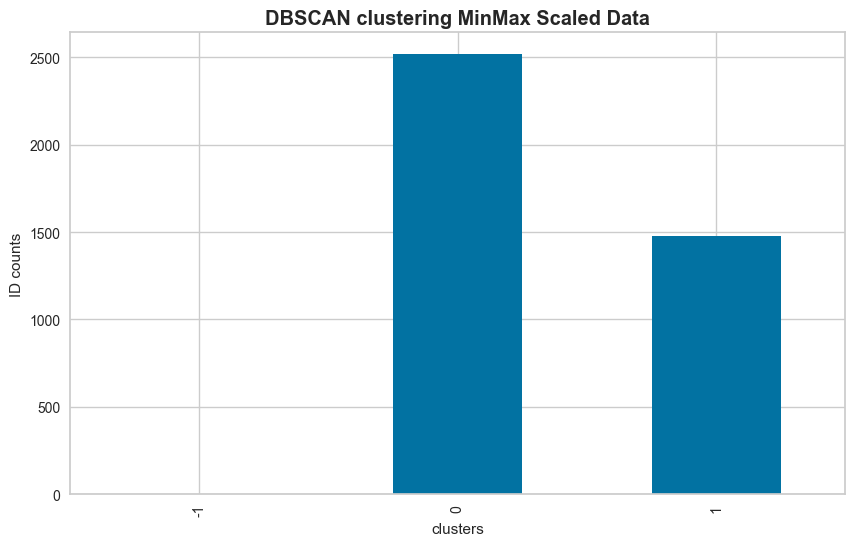

In [215]:
fig, ax = plt.subplots(figsize = (10,6))
df_db2.groupby(df_db2['DBSCAN_labels']).count()['Balance'].plot(kind = 'bar')
# the column 'Balance' is used for counting purpose and nothing more than that
plt.ylabel('ID counts')
plt.title('DBSCAN clustering MinMax Scaled Data', fontsize = 'large', fontweight = 'bold')
plt.xlabel('clusters')
plt.show()

__Conclusion:__

We worked with three algorithms, and two type of scaled data in our analysis. One thing remained the same was that, MinMax Scaling produces better results for classification of data into different clusters. 
And in all those classifications, we always came across two clusters. So now we would be looking at those clusters closely. 

In cluster number 0 and 1, there are more customers, so we need to focus on clusters 0 and 1.

In [217]:
cluster1 = pd.DataFrame(df.loc[df_db2.DBSCAN_labels == 0].mean(), columns = ['Cluster1_Avg'])
cluster2 = pd.DataFrame(df.loc[df_db2.DBSCAN_labels == 1].mean(), columns = ['Cluster2_Avg'])

In [218]:
avg_df = pd.concat([cluster1, cluster2], axis =1)
avg_df

,Cluster1_Avg,Cluster2_Avg
Balance,59821.538951,97010.442568
Qual_miles,87.672099,240.020946
cc1_miles,1.705882,2.662838
cc2_miles,1.013911,1.015541
cc3_miles,1.007154,1.018243
Bonus_miles,10202.374006,28876.327703
Bonus_trans,9.147456,15.735135
Flight_miles_12mo,226.472178,837.258108
Flight_trans_12,0.653021,2.565541
Days_since_enroll,3822.635533,4627.259459


__Conclusion:__

We know that past Award has value either 0 or 1. Cluster2 has award average of 1, so that means that all those people who are awarded are clustered into the cluster 2. And likewise, people who were not awarded are clustered into cluster 1. 

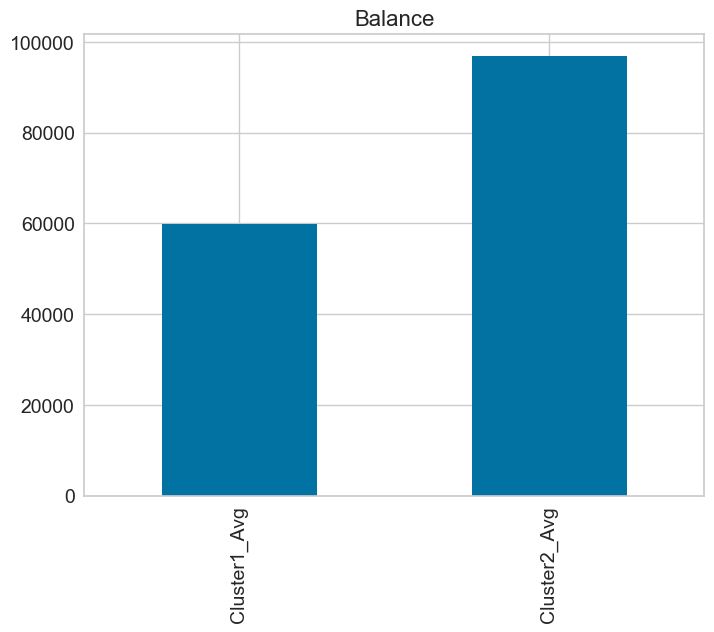

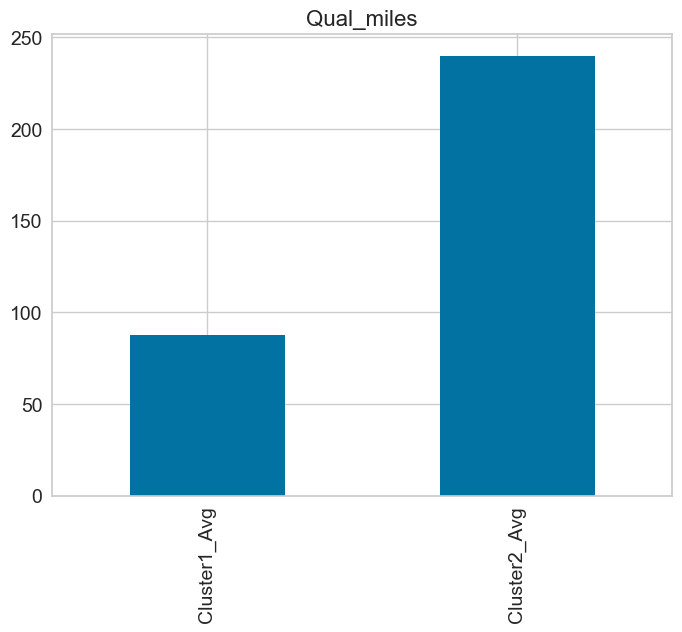

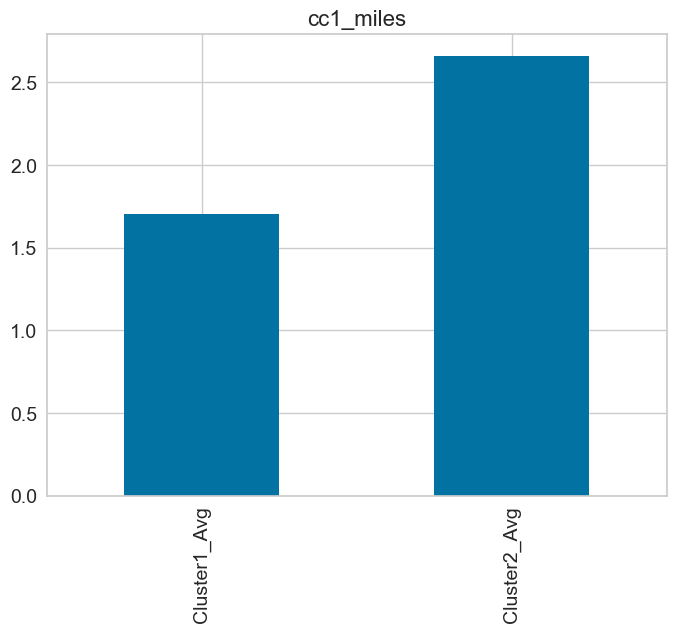

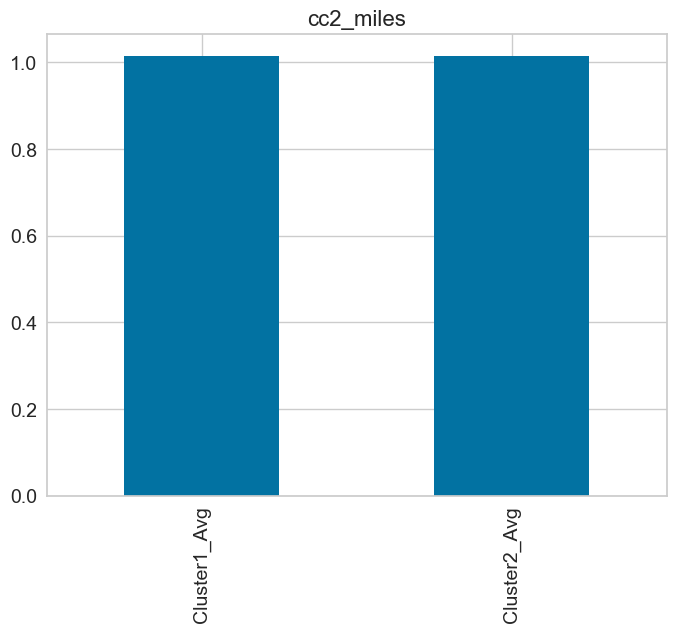

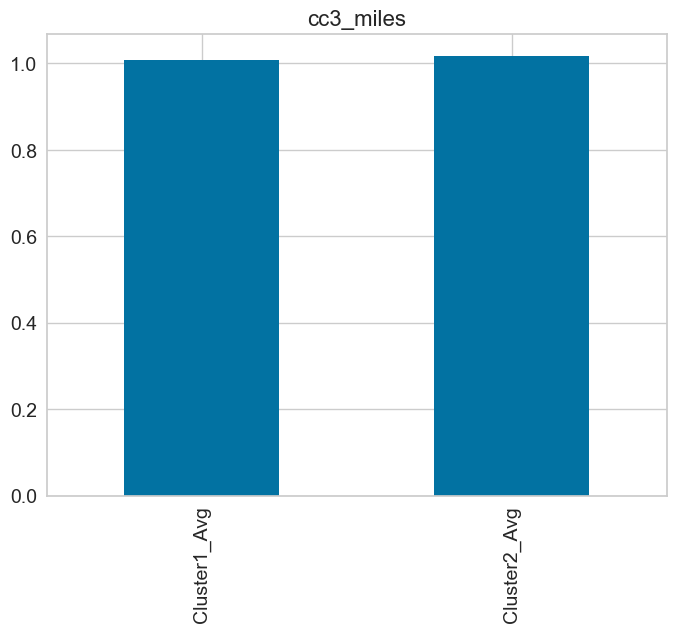

...

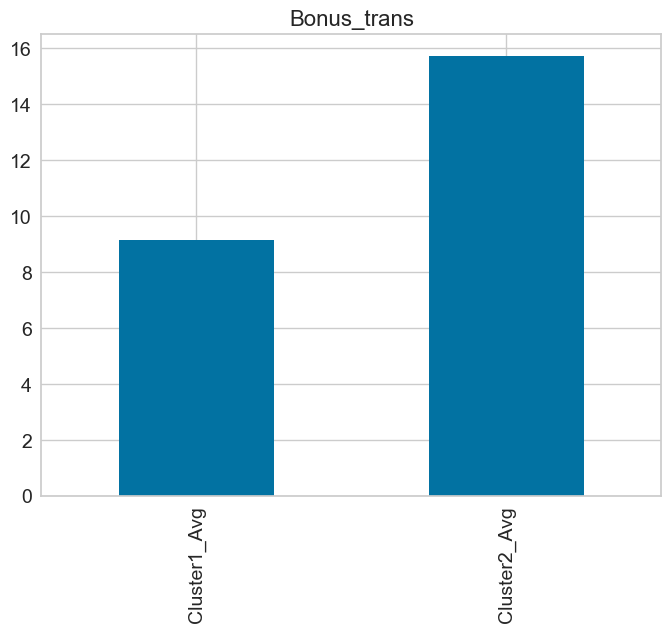

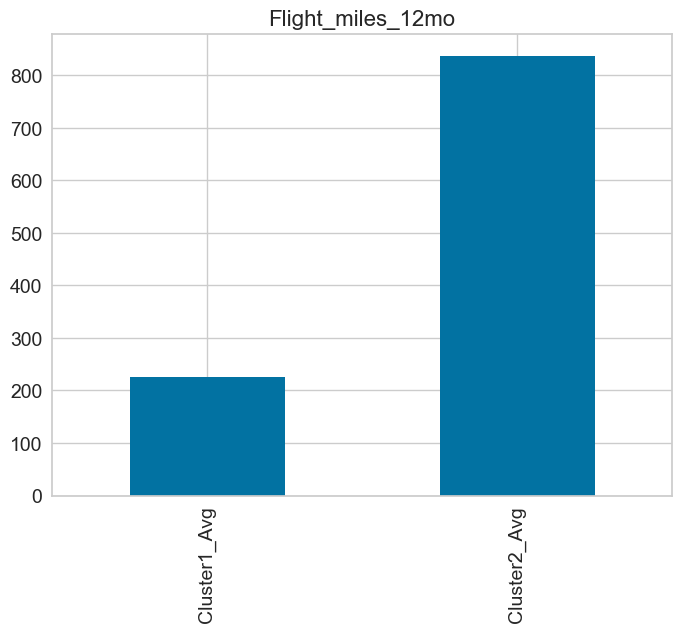

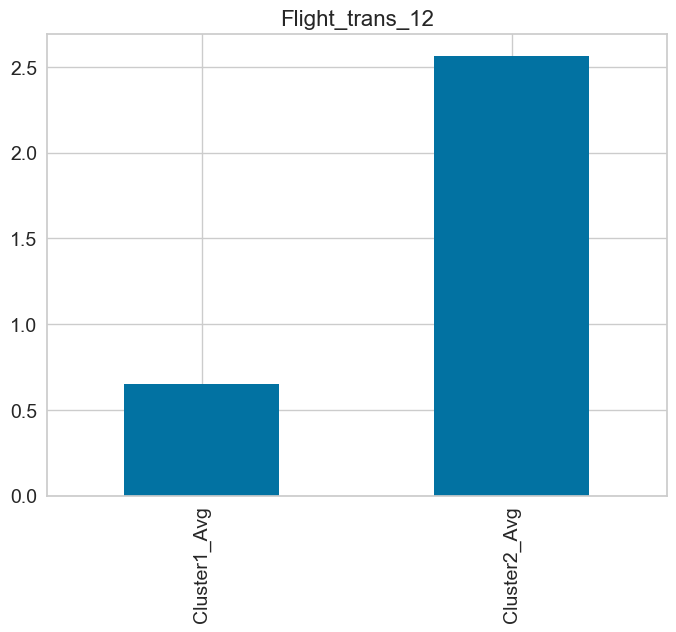

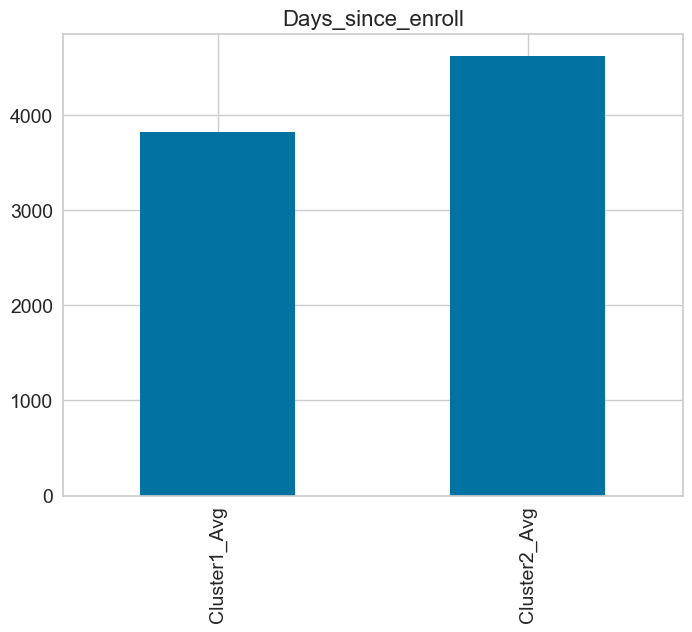

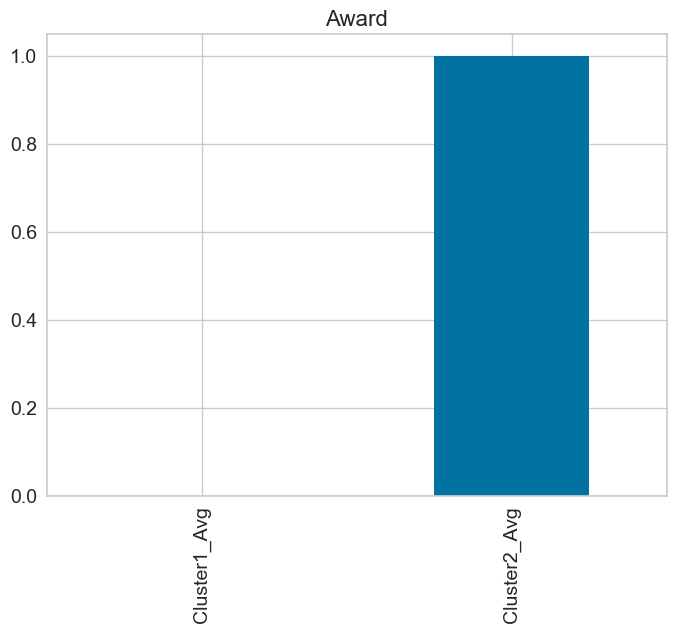

In [221]:
for i, row in avg_df.iterrows():
    fig = plt.subplots(figsize =(8,6))
    j = avg_df.xs(i, axis =0)
    plt.title(i, fontsize = 16, fontweight = 20)
    j.plot(kind = 'bar', fontsize = 14)
    plt.show()
    print()

# Conclusion:

So, DBSCAN model on MinMax Scaled data could be taken as the final model to understand the data provided to us. 

As we discussed earlier also, standard scaled data was not of much relevance, as the silhouette score was comparatively low and also, it produces unfavorbale results. 

Both DBSCAN and Hierarchical models produces the similar results on MinMax Scaled data. But KMeans performed differently, as it is sensitive to outliers. Whereas, DBSCAN can take care of outliers simply by assigning them label of '-1'. So, those points simply wont be a part of any group. 


So, we can form our plans based on weither the person was awarded the flight for free or not!